In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [7]:
import numpy as np
import networkx as nx
import os
# Settings for autoreloading

%load_ext autoreload
%autoreload 2
from random import seed

# Settings for reproducibility
SEED = 42
np.random.seed(SEED)
seed(SEED)

# Important constants
import sys
utils_folder_path = '/content/gdrive/My Drive/SIN_JCOMP_7'
sys.path.append(utils_folder_path)

CITY_NAME = 'Bangalore'
GEOJSON_PATH = '/content/gdrive/My Drive/SIN_JCOMP_7/bangalore_wards.json'
TRAVEL_TIMES_DATA_PATH = '/content/gdrive/My Drive/SIN_JCOMP_7/bangalore-wards-2020-1-All-HourlyAggregate.csv'





The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
# Import modules from the 'utils' folder
from utils.geodataframe import get_geodataframe
from utils.geodataframe import set_geodataframe_centroids
from utils.spatial_network import get_spatial_network
from utils.graphics import plot_spatial_network

# Create a geodataframe
gdf = get_geodataframe(GEOJSON_PATH)

print(f'Geodataframe of {CITY_NAME}:')
gdf.head()



Geodataframe of Bangalore:


,geometry,WARD_NO,WARD_NAME,MOVEMENT_ID,DISPLAY_NAME
0,"MULTIPOLYGON (((77.59229 13.09720, 77.59094 13...",2,Chowdeswari Ward,1,"Unnamed Road, Bengaluru"
1,"MULTIPOLYGON (((77.56862 13.12705, 77.57064 13...",3,Atturu,2,"9th Cross Bhel Layout, Adityanagar, Vidyaranya..."
2,"MULTIPOLYGON (((77.59094 13.09842, 77.59229 13...",4,Yelahanka Satellite Town,3,"15th A Cross Road, Yelahanka Satellite Town, Y..."
3,"MULTIPOLYGON (((77.67683 13.01147, 77.67695 13...",51,Vijnanapura,4,"SP Naidu Layout 4th Cross Street, SP Naidu Lay..."
4,"MULTIPOLYGON (((77.72899 13.02061, 77.72994 13...",53,Basavanapura,5,"Medahalli Kadugodi Road, Bharathi Nagar, Krish..."


In [ ]:
set_geodataframe_centroids(gdf)
print(f'Geodataframe of {CITY_NAME} after the centroid computation:')
gdf.head()

Geodataframe of Bangalore after the centroid computation:


,geometry,WARD_NO,WARD_NAME,MOVEMENT_ID,DISPLAY_NAME,centroid
0,"MULTIPOLYGON (((77.59229 13.09720, 77.59094 13...",2,Chowdeswari Ward,1,"Unnamed Road, Bengaluru",POINT (77.58042 13.12171)
1,"MULTIPOLYGON (((77.56862 13.12705, 77.57064 13...",3,Atturu,2,"9th Cross Bhel Layout, Adityanagar, Vidyaranya...",POINT (77.56004 13.10280)
2,"MULTIPOLYGON (((77.59094 13.09842, 77.59229 13...",4,Yelahanka Satellite Town,3,"15th A Cross Road, Yelahanka Satellite Town, Y...",POINT (77.58393 13.09099)
3,"MULTIPOLYGON (((77.67683 13.01147, 77.67695 13...",51,Vijnanapura,4,"SP Naidu Layout 4th Cross Street, SP Naidu Lay...",POINT (77.66957 13.00606)
4,"MULTIPOLYGON (((77.72899 13.02061, 77.72994 13...",53,Basavanapura,5,"Medahalli Kadugodi Road, Bharathi Nagar, Krish...",POINT (77.71546 13.01685)


In [ ]:
spatial_network = get_spatial_network(gdf)
print(f'Number of nodes in the spatial network: {len(spatial_network.nodes())}')
print(f'Number of edges in the spatial network: {len(spatial_network.edges())}')
print(f'Spatial network density: {nx.density(spatial_network)}')

Number of nodes in the spatial network: 198
Number of edges in the spatial network: 582
Spatial network density: 0.029841562836486694


In [ ]:
print(f'The spatial network is directed: {nx.is_directed(spatial_network)}')

The spatial network is directed: False


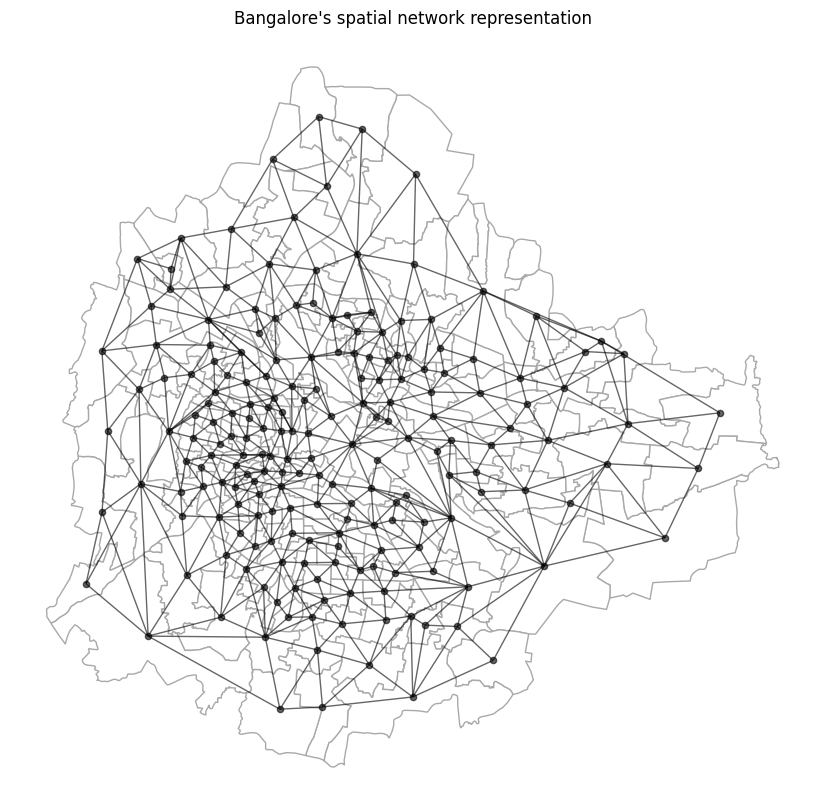

In [ ]:
plot_spatial_network(gdf, spatial_network, title=f"{CITY_NAME}'s spatial network representation")

In [ ]:
from utils.temporal_network import get_movement_dataframe

df = get_movement_dataframe(TRAVEL_TIMES_DATA_PATH)

print(f"{CITY_NAME}'s movement dataframe:")
df.head()

Bangalore's movement dataframe:


,sourceid,dstid,hod,mean_travel_time
0,183,54,22,3071.62
1,186,24,22,991.61
2,181,74,22,2327.47
3,187,14,22,1609.11
4,182,64,22,2635.08


In [ ]:
from utils.temporal_network import get_temporal_networks_from_pandas_edgelist

temporal_networks_dict = get_temporal_networks_from_pandas_edgelist(df, [0, 9, 18,21])
for k, v in temporal_networks_dict.items():
   print(f'Temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())} density: {nx.density(v)}')

Temporal network at time 0: nodes: 198 edges: 32526 density: 0.8338717120443009
Temporal network at time 9: nodes: 198 edges: 36432 density: 0.934010152284264
Temporal network at time 18: nodes: 198 edges: 37044 density: 0.9497000461467466
Temporal network at time 21: nodes: 198 edges: 36421 density: 0.9337281443880429


In [ ]:
for k, v in temporal_networks_dict.items():
    print(f'Temporal network at time {k} is directed: {nx.is_directed(v)}')

Temporal network at time 0 is directed: True
Temporal network at time 9 is directed: True
Temporal network at time 18 is directed: True
Temporal network at time 21 is directed: True


In [ ]:
from utils.metrics import get_nodes_in_degree_centrality

temporal_networks_in_degrees = {
    k: get_nodes_in_degree_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

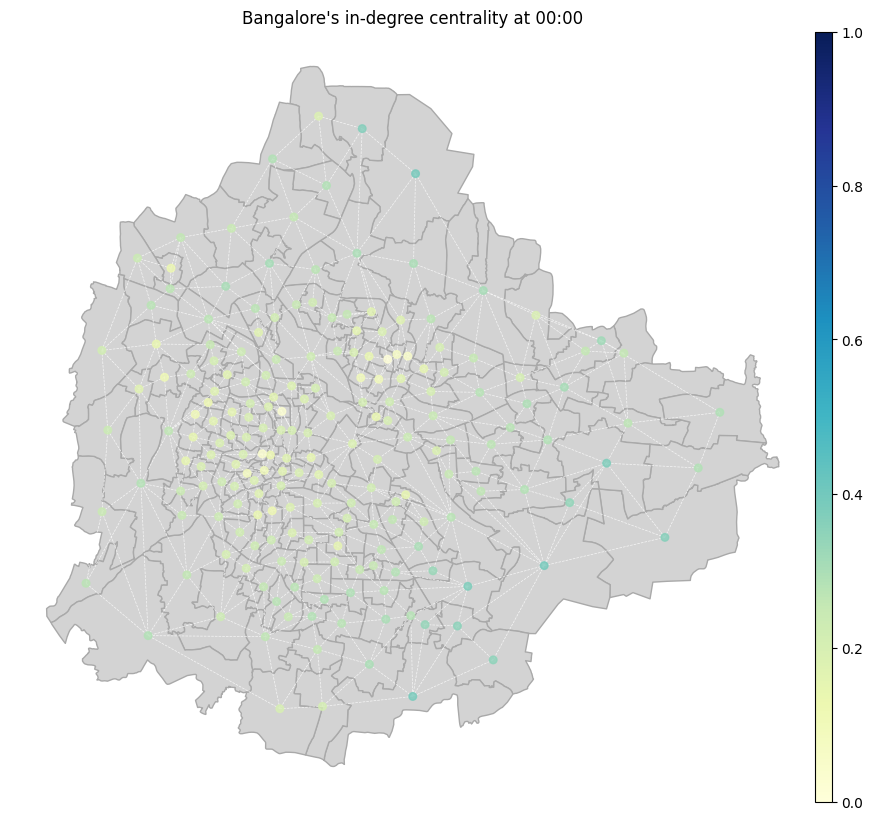

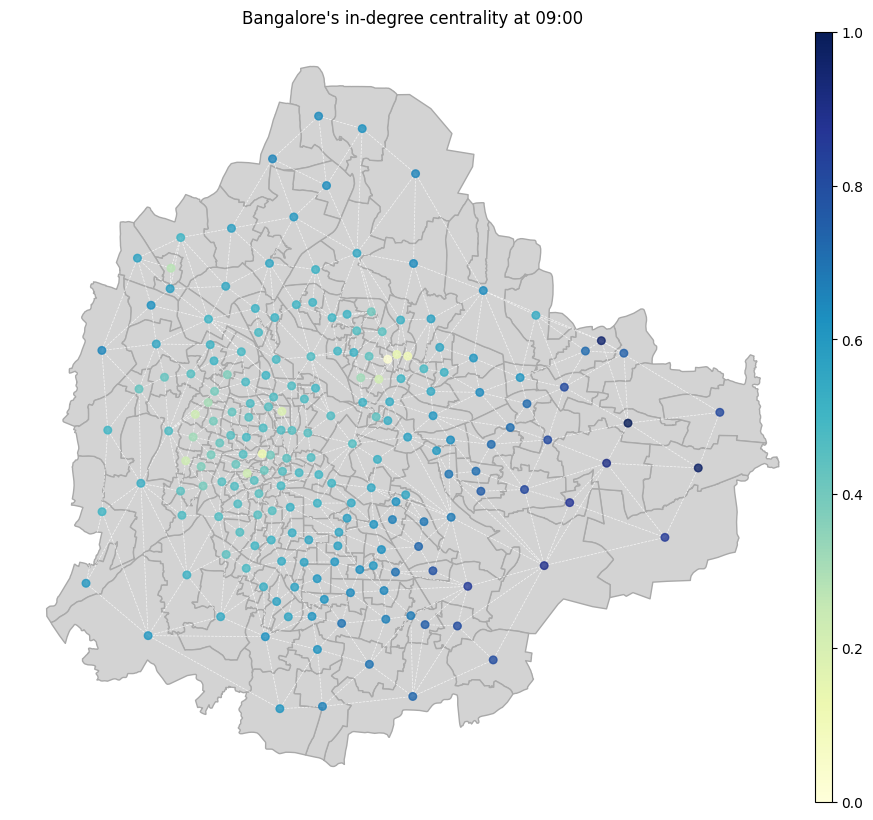

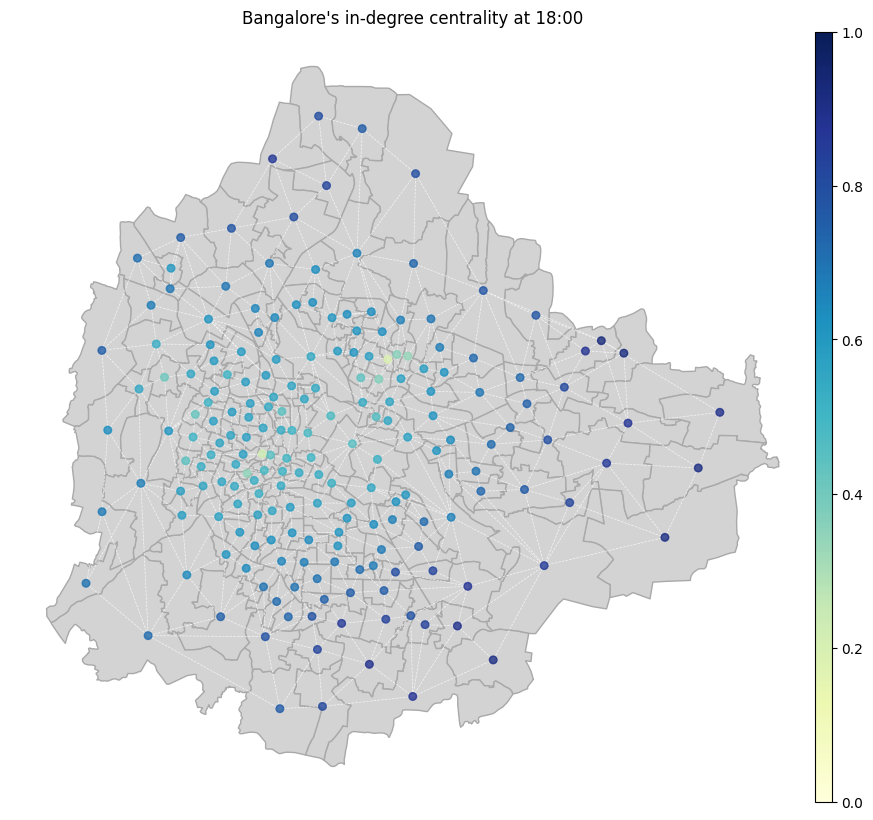

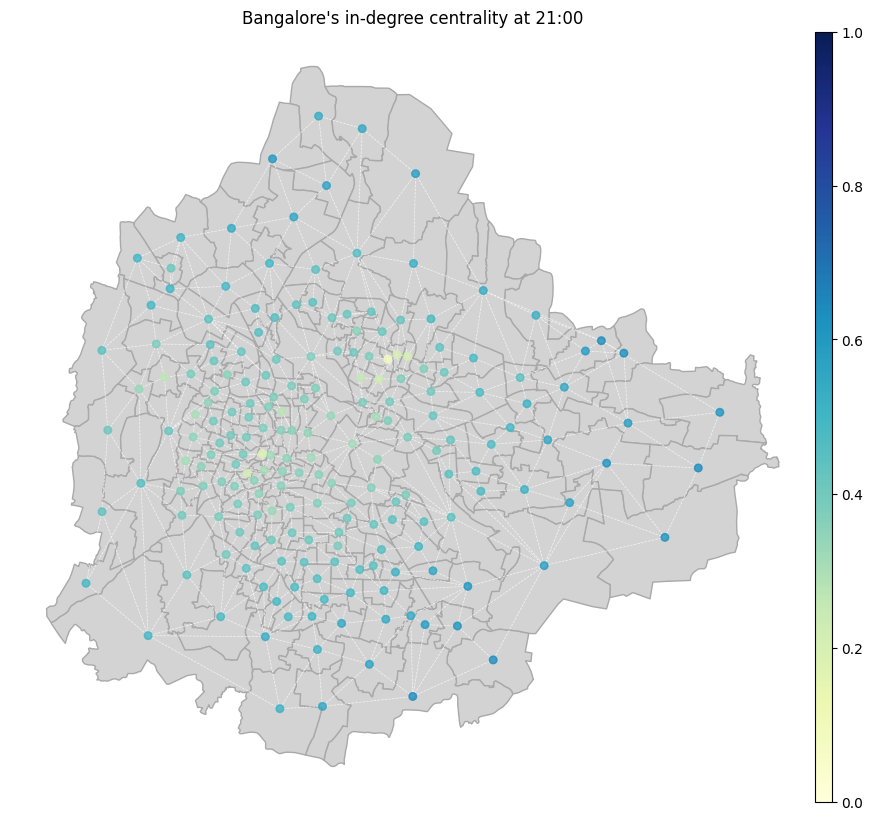

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_in_degrees, CITY_NAME, 'in-degree')

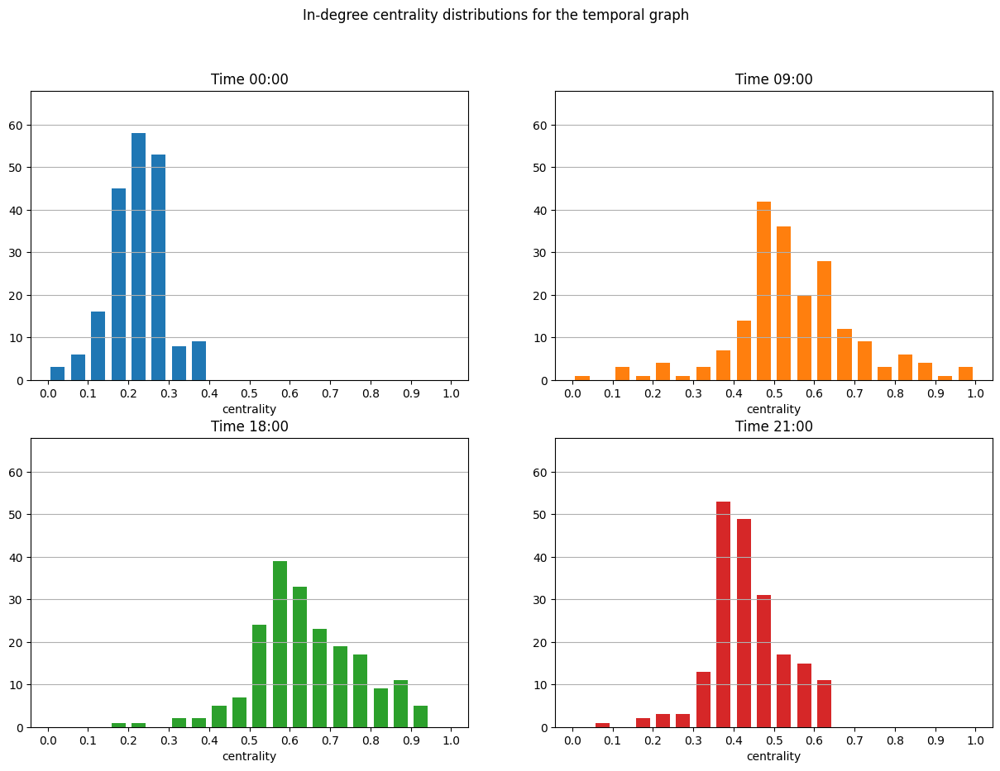

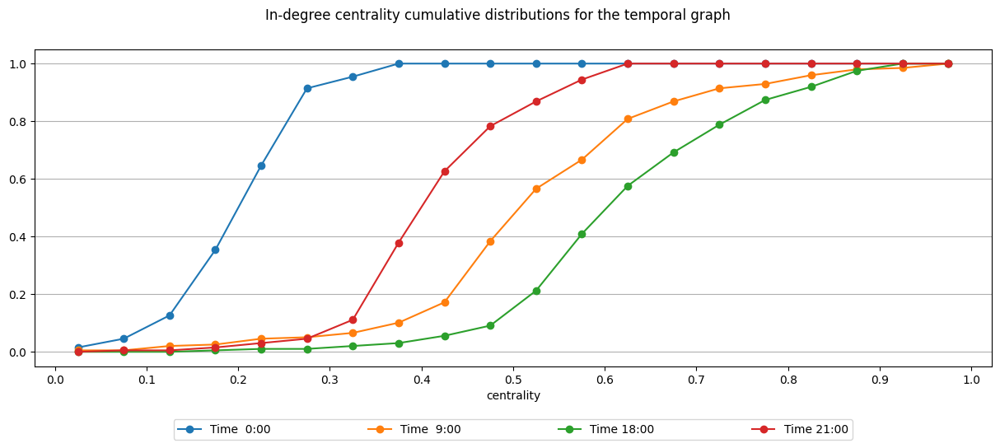

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_in_degrees, 'in-degree centrality')

In [ ]:
from utils.metrics import get_nodes_out_degree_centrality

temporal_networks_out_degrees = {
    k: get_nodes_out_degree_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

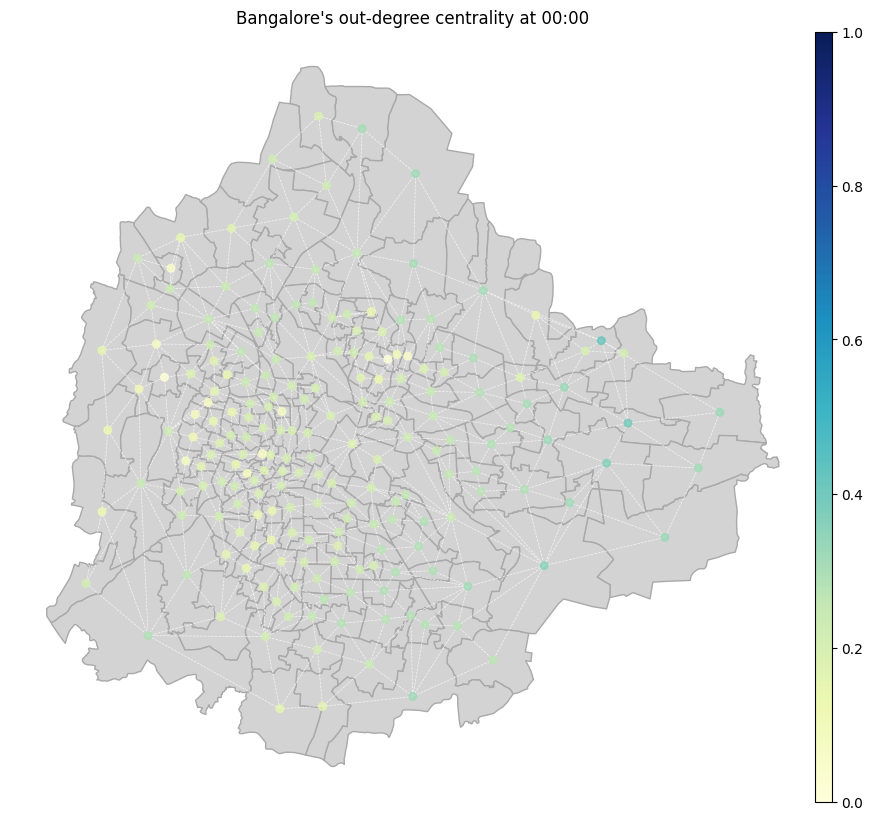

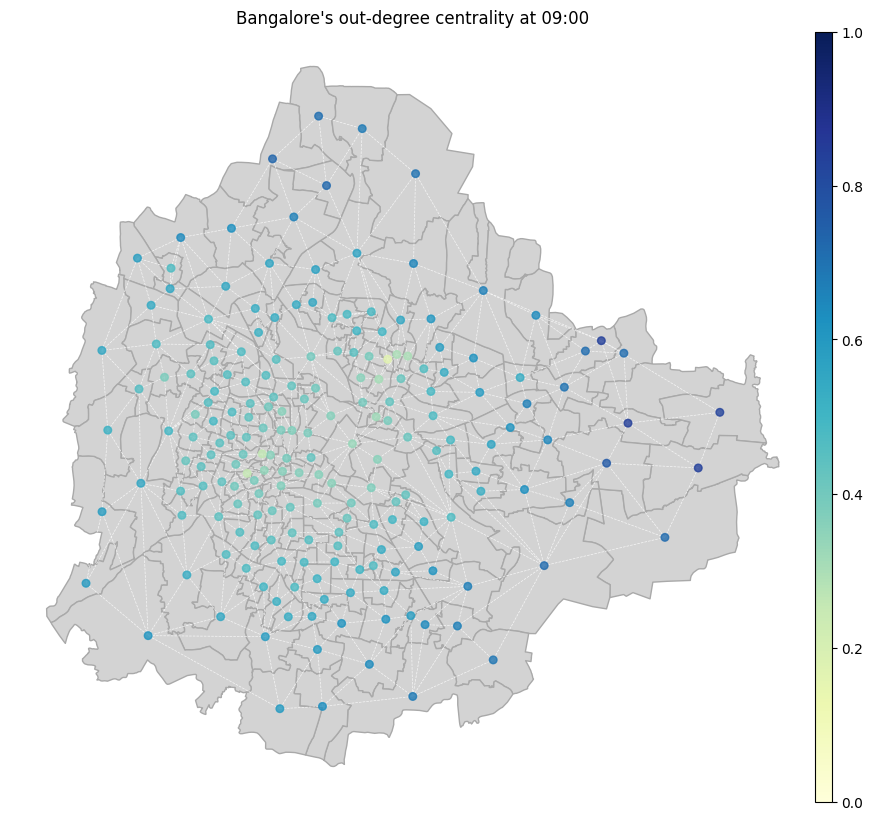

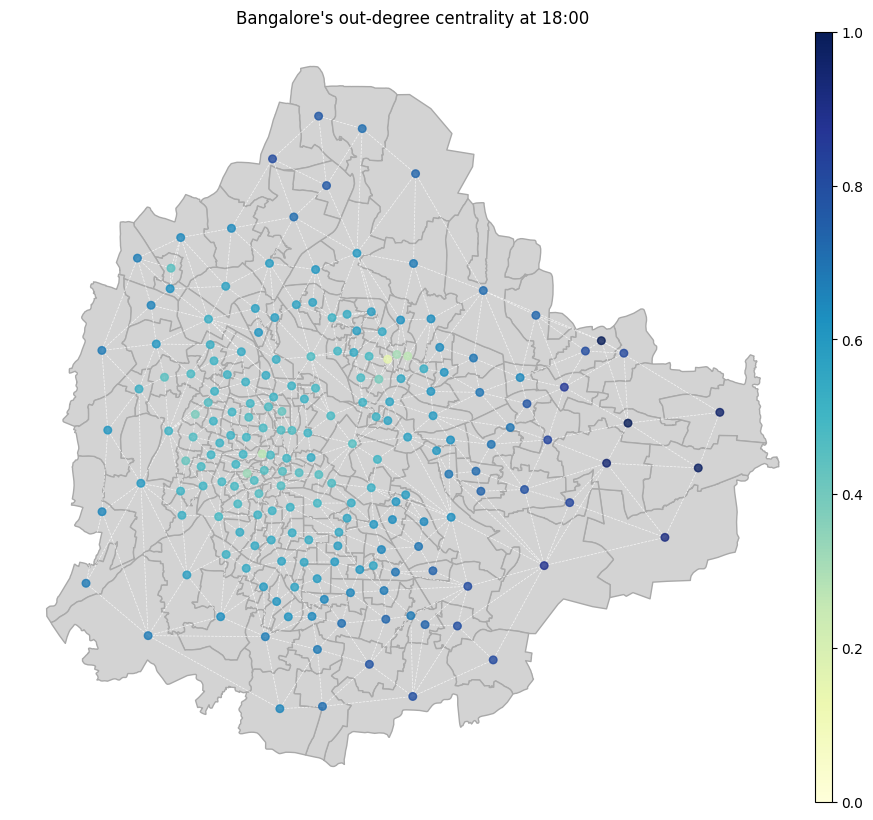

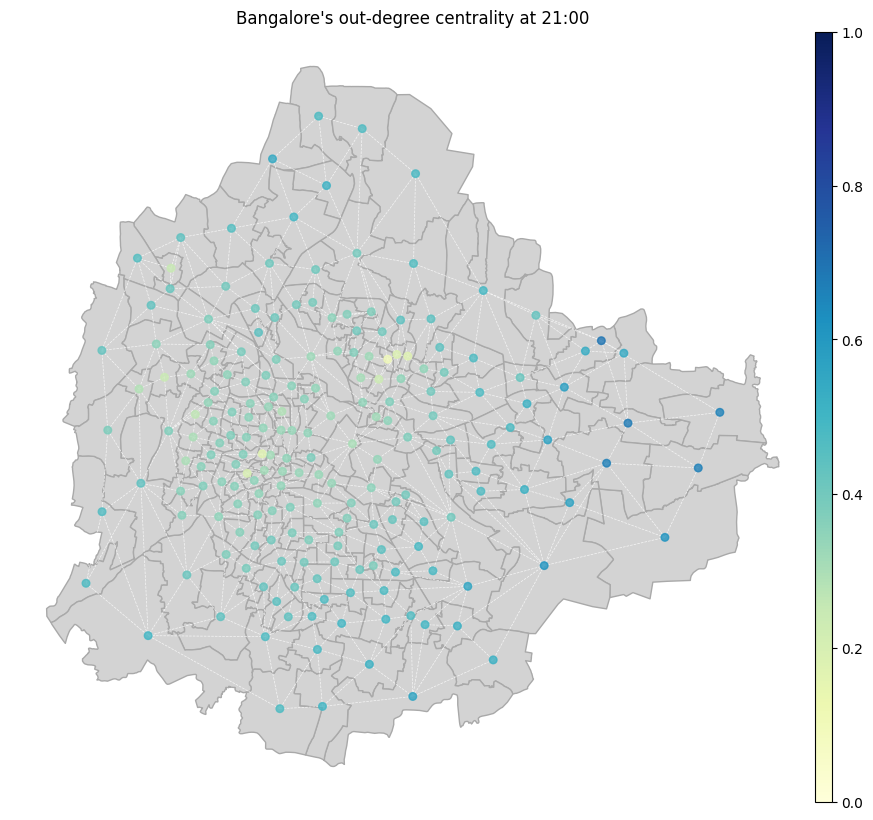

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_out_degrees, CITY_NAME, 'out-degree')

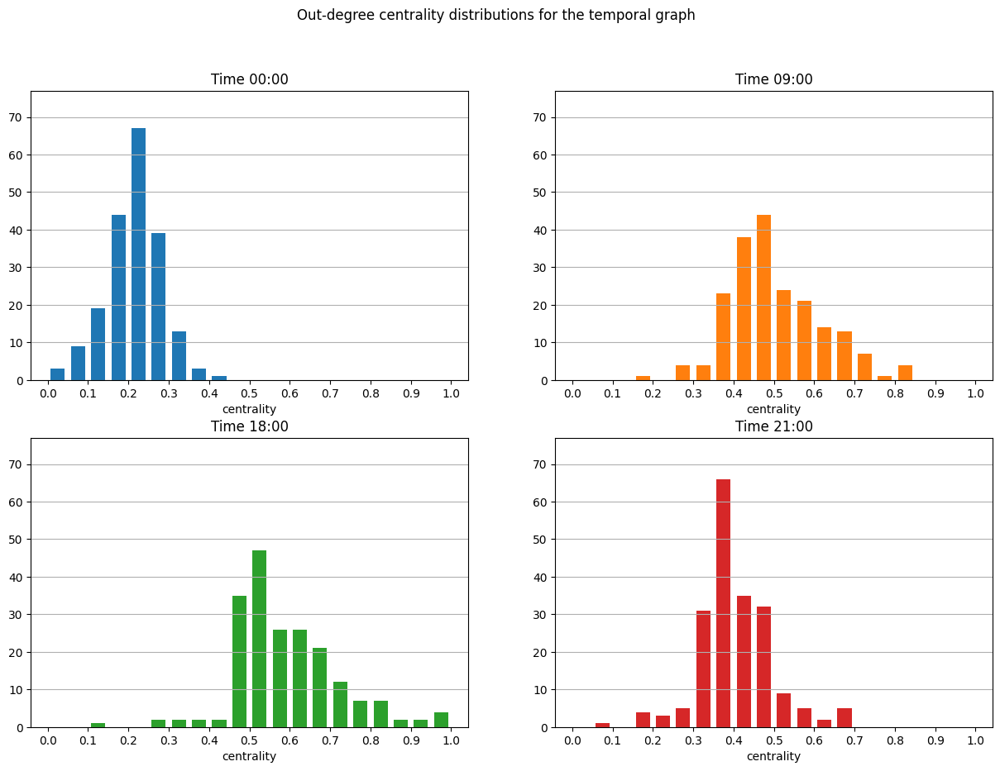

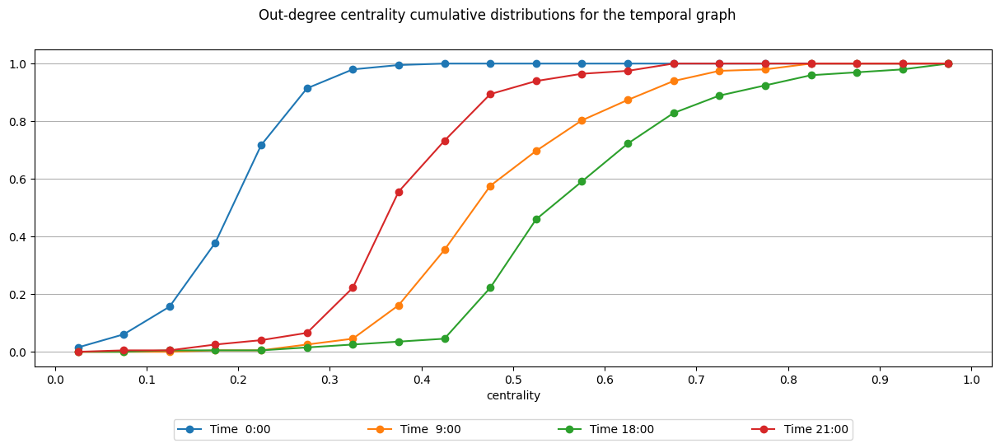

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_out_degrees, 'out-degree centrality')

In [ ]:
from utils.metrics import get_nodes_betweenness_centrality

temporal_networks_betweenness = {
    k: get_nodes_betweenness_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

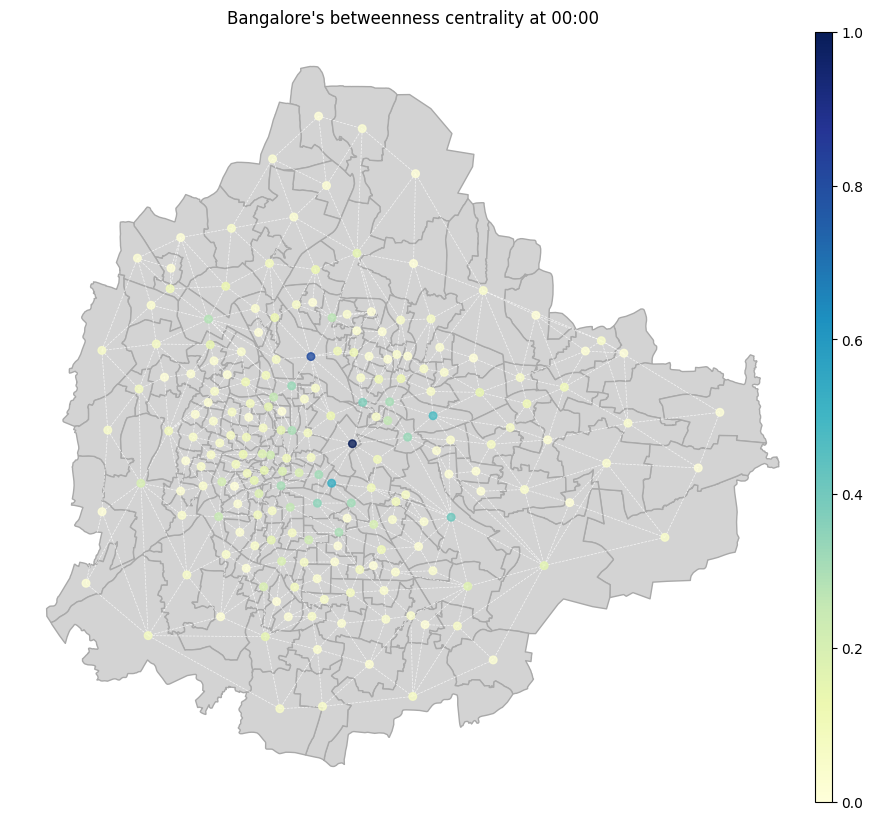

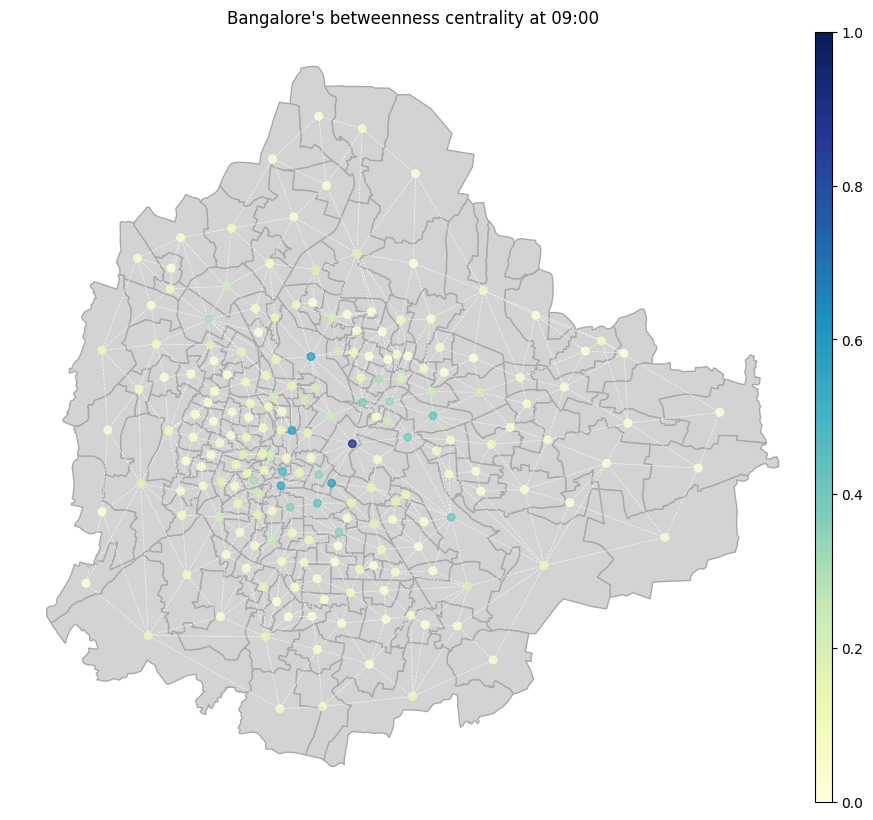

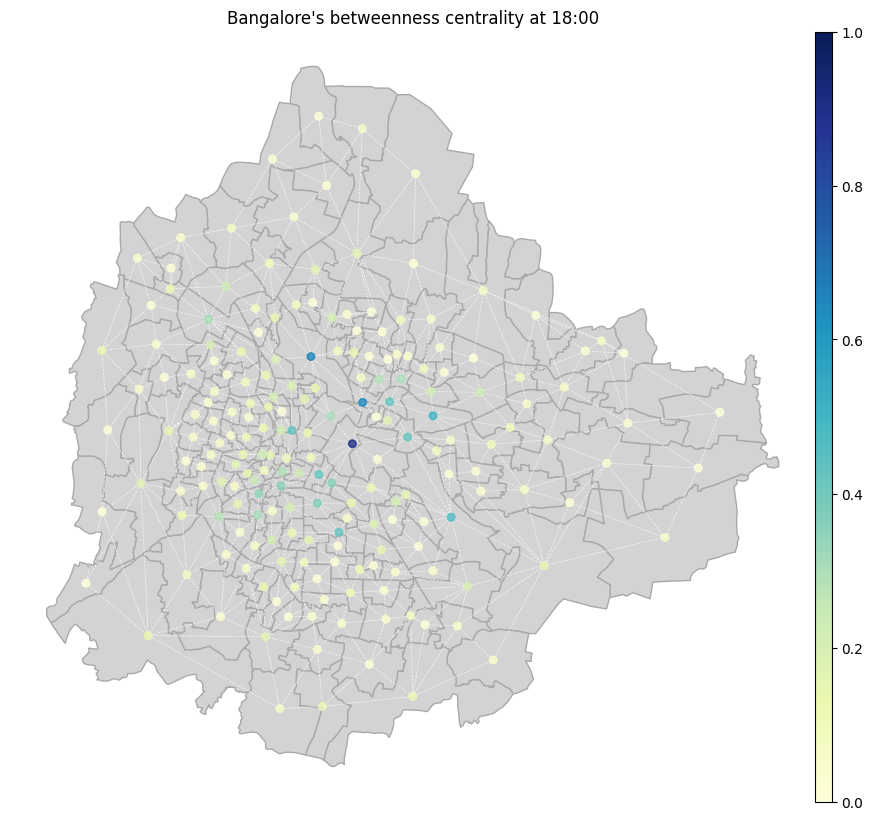

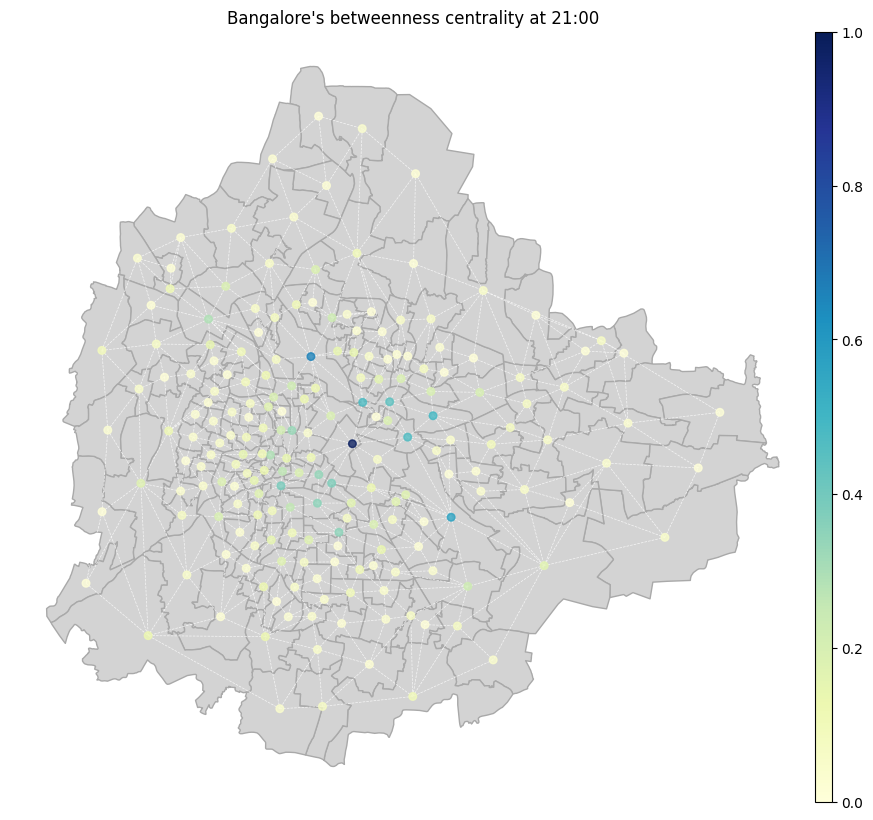

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_betweenness, CITY_NAME, 'betweenness')

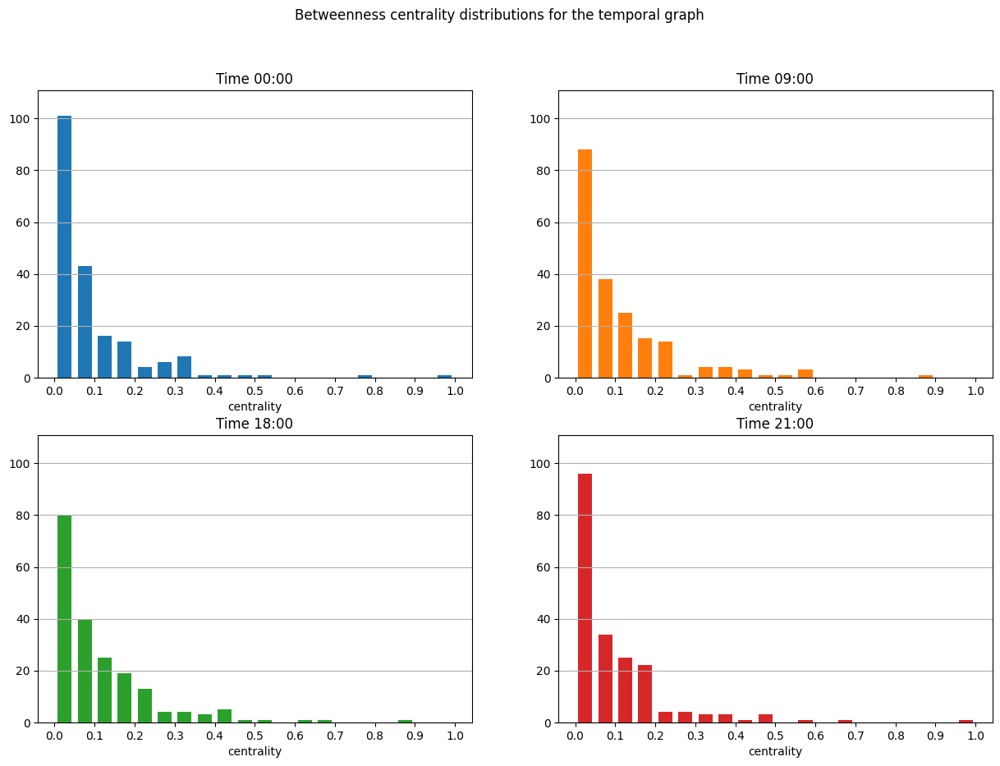

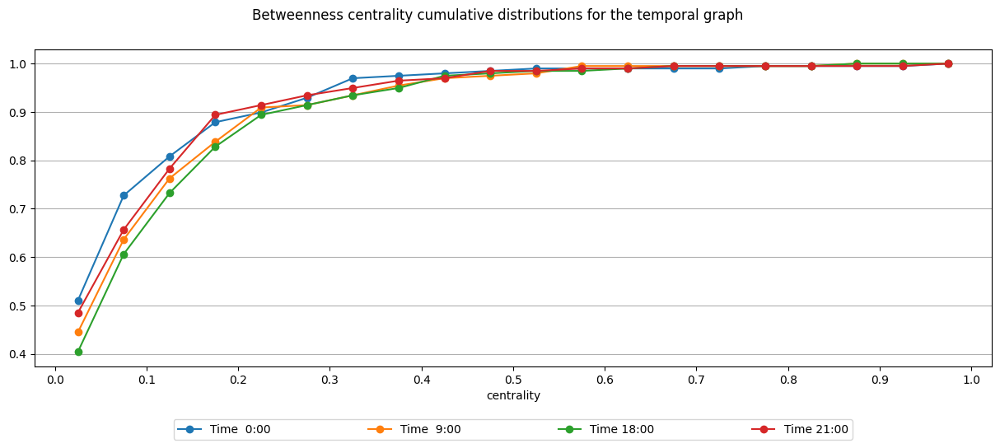

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_betweenness, 'betweenness centrality')

In [ ]:
from utils.metrics import get_nodes_betweenness_centrality

spatial_network_betweenness = get_nodes_betweenness_centrality(spatial_network, weight='weight', normalize=True)

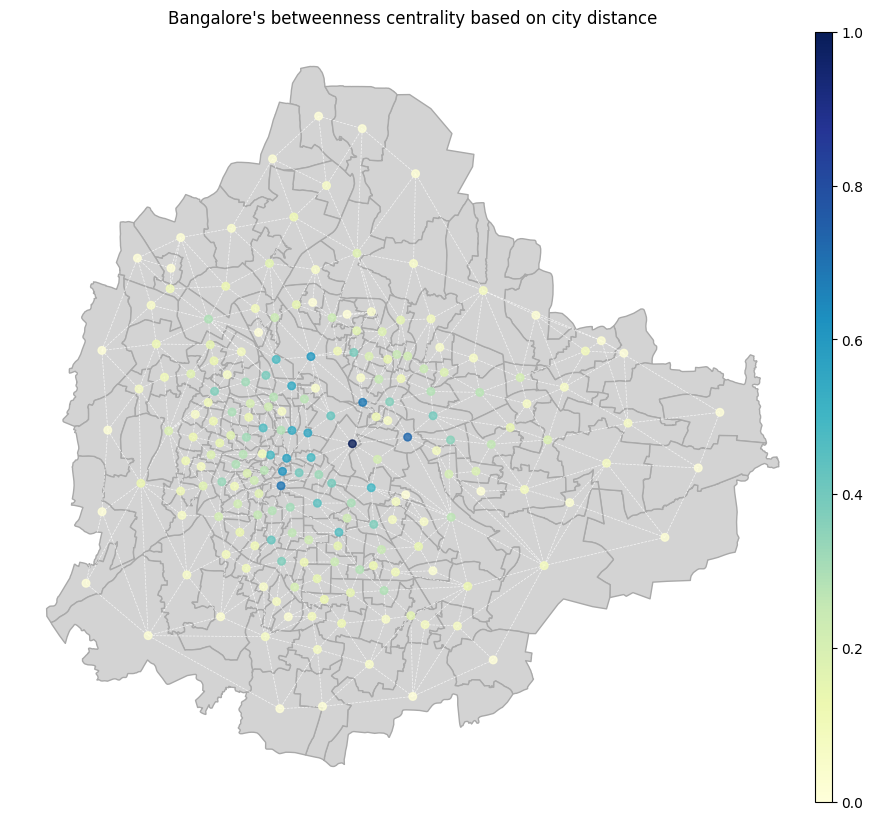

In [ ]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_betweenness,
                title = f"{CITY_NAME}'s betweenness centrality based on city distance")

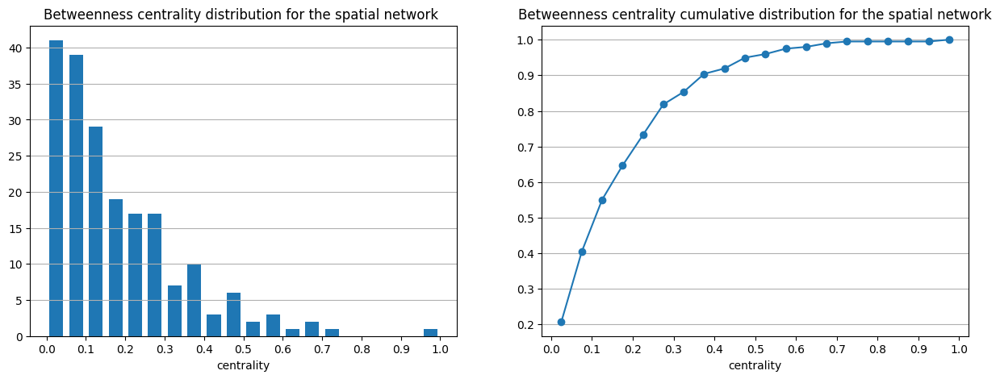

In [ ]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_betweenness, 'betweenness centrality')

In [ ]:
from utils.metrics import get_nodes_closeness_centrality

temporal_networks_closeness = {
    k: get_nodes_closeness_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

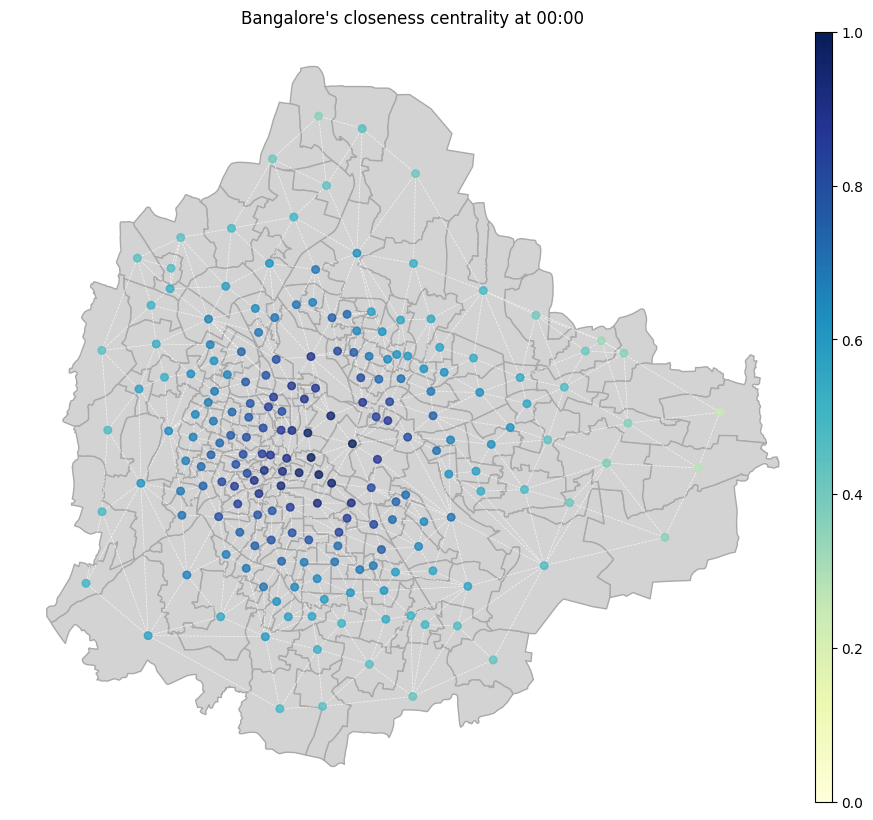

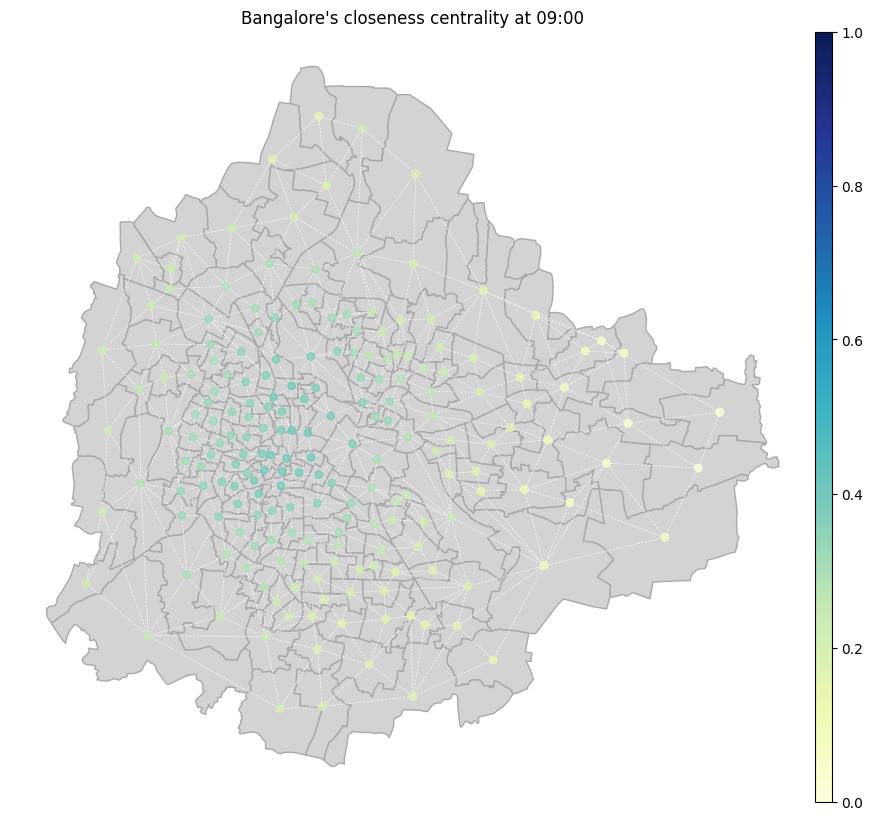

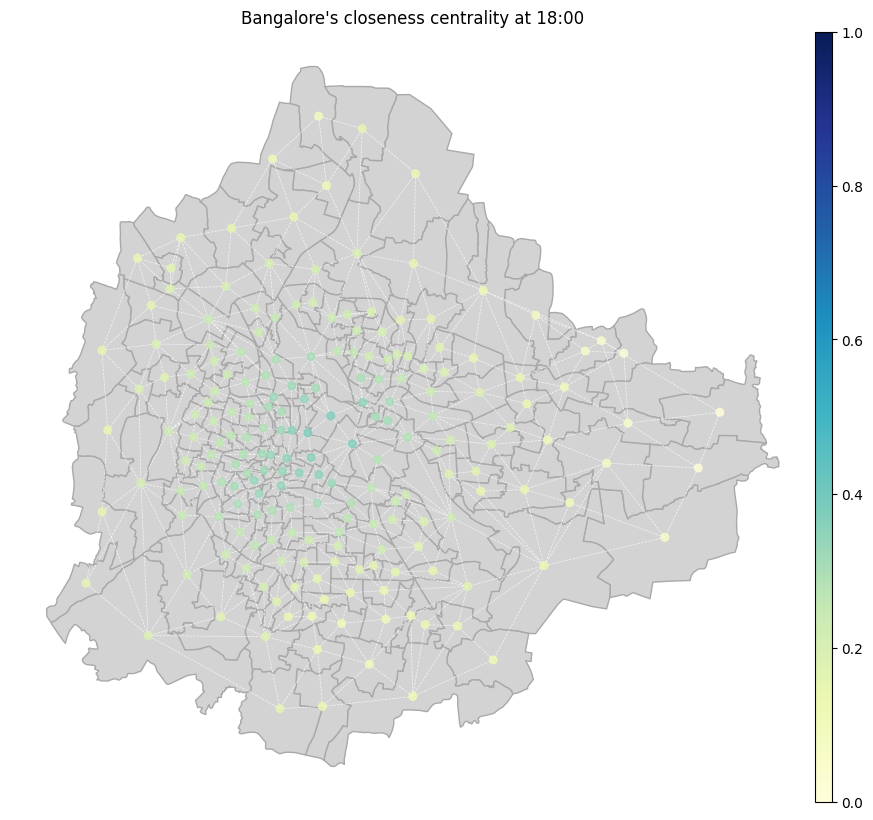

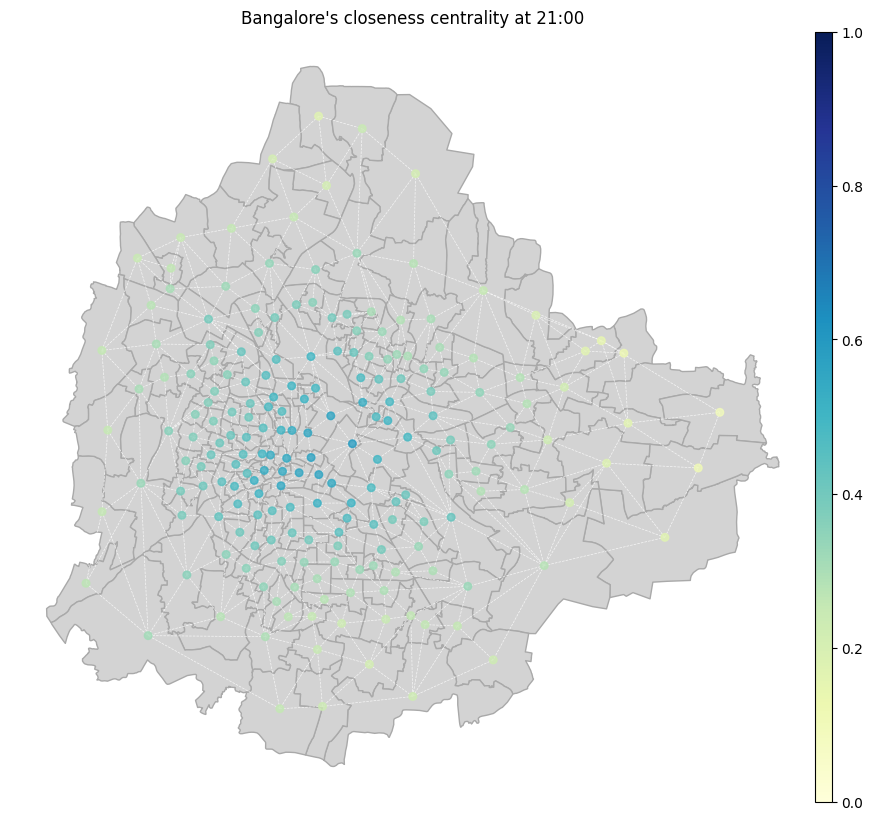

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_closeness, CITY_NAME, 'closeness')


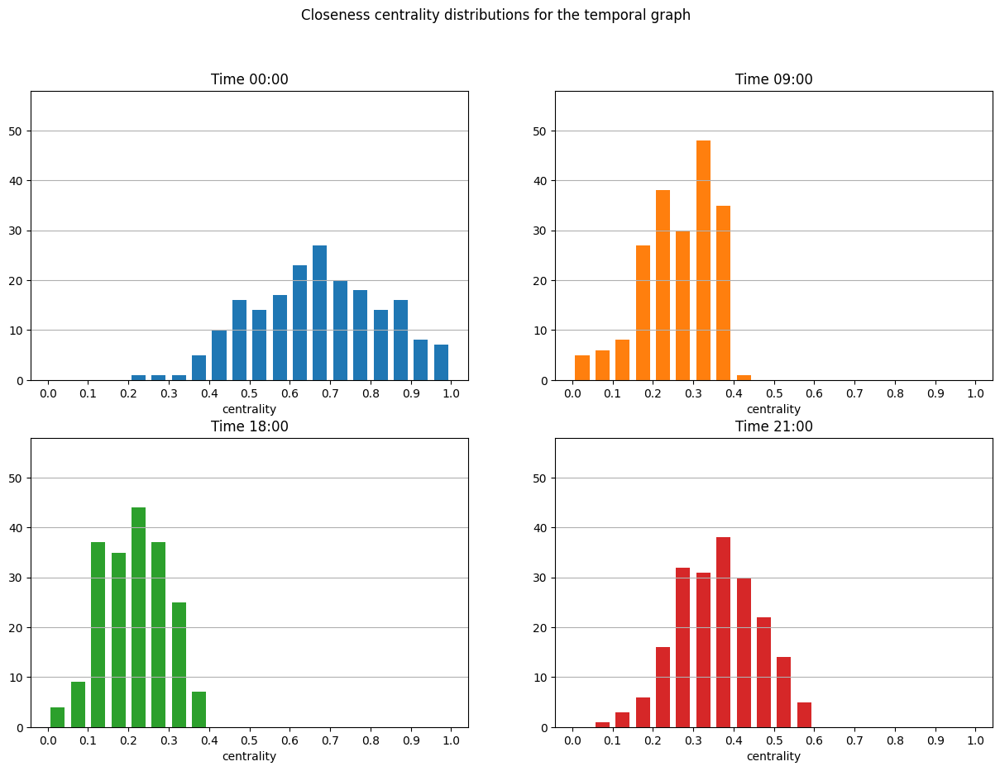

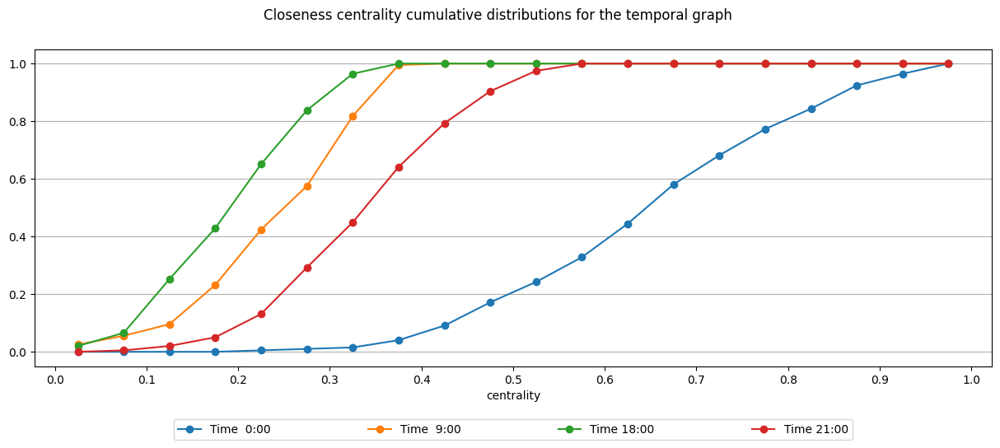

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_closeness, 'closeness centrality')

In [ ]:
from utils.metrics import get_nodes_closeness_centrality

spatial_network_closeness = get_nodes_closeness_centrality(spatial_network, weight='weight', normalize=True)

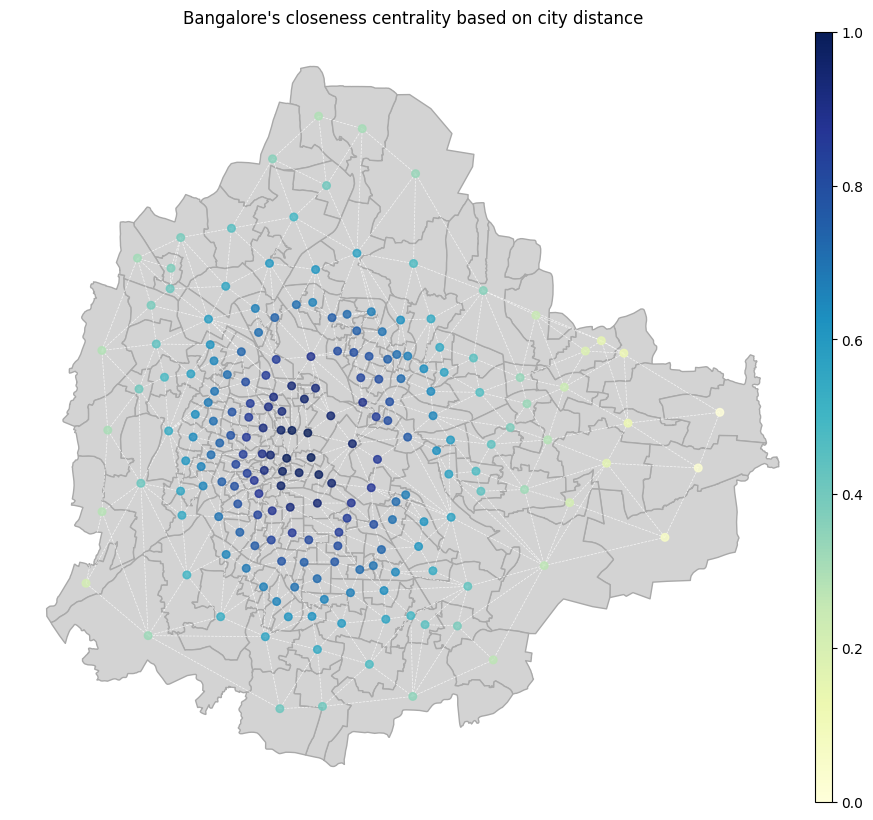

In [ ]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_closeness,
                title=f"{CITY_NAME}'s closeness centrality based on city distance")


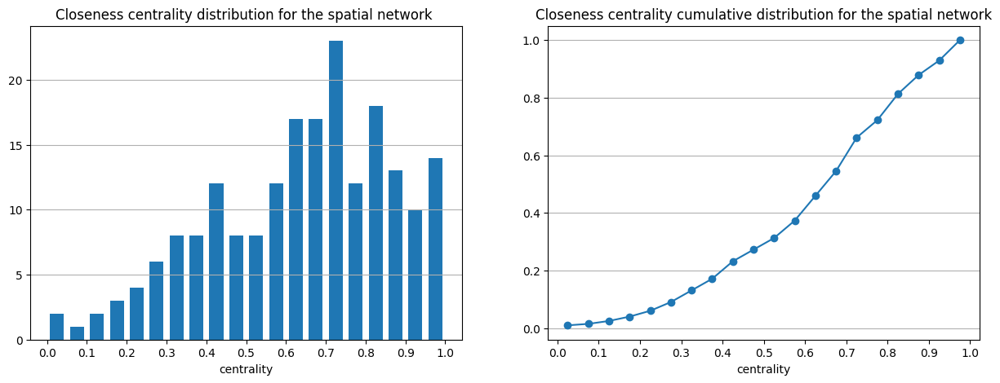

In [ ]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_closeness, 'closeness centrality')

In [ ]:
from utils.metrics import get_nodes_pagerank_centrality

temporal_networks_pagerank = {
    k: get_nodes_pagerank_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

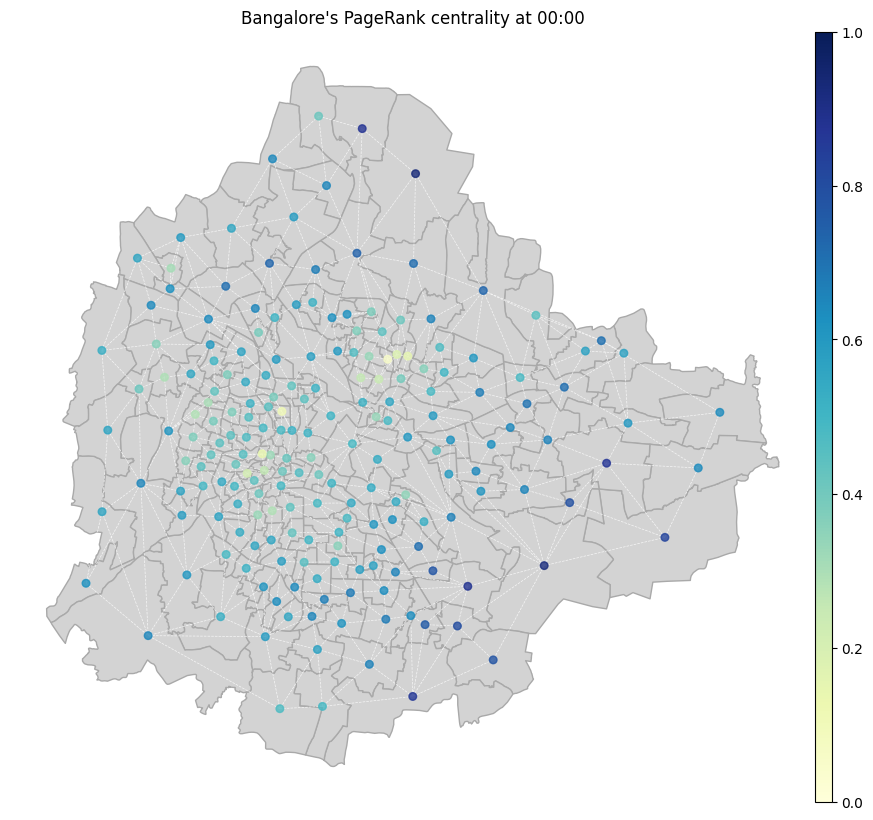

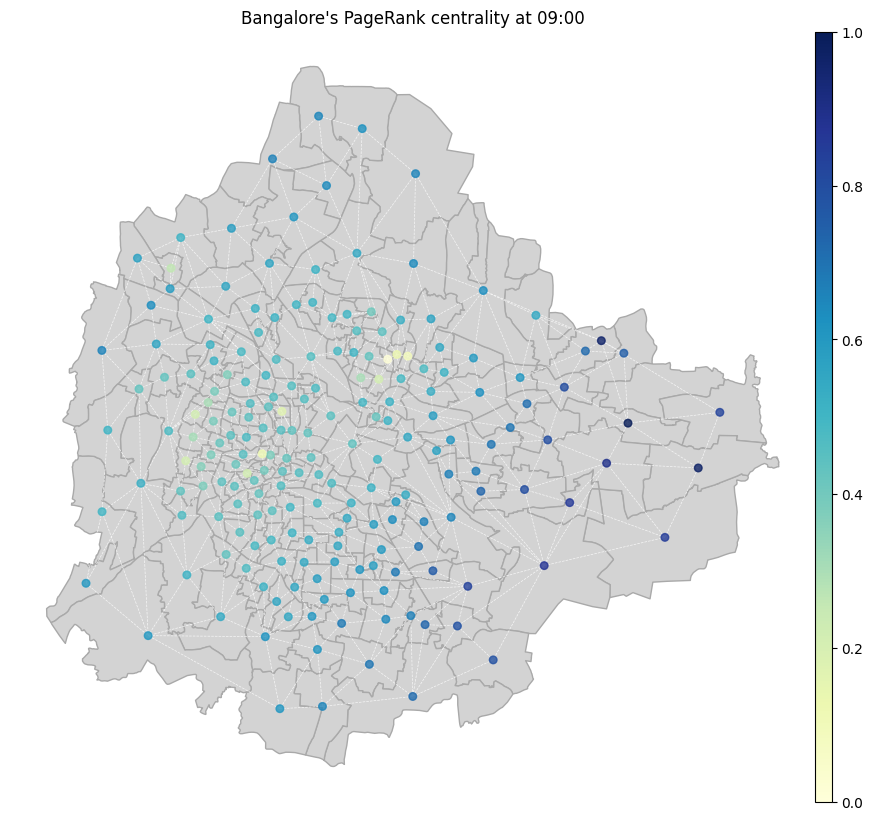

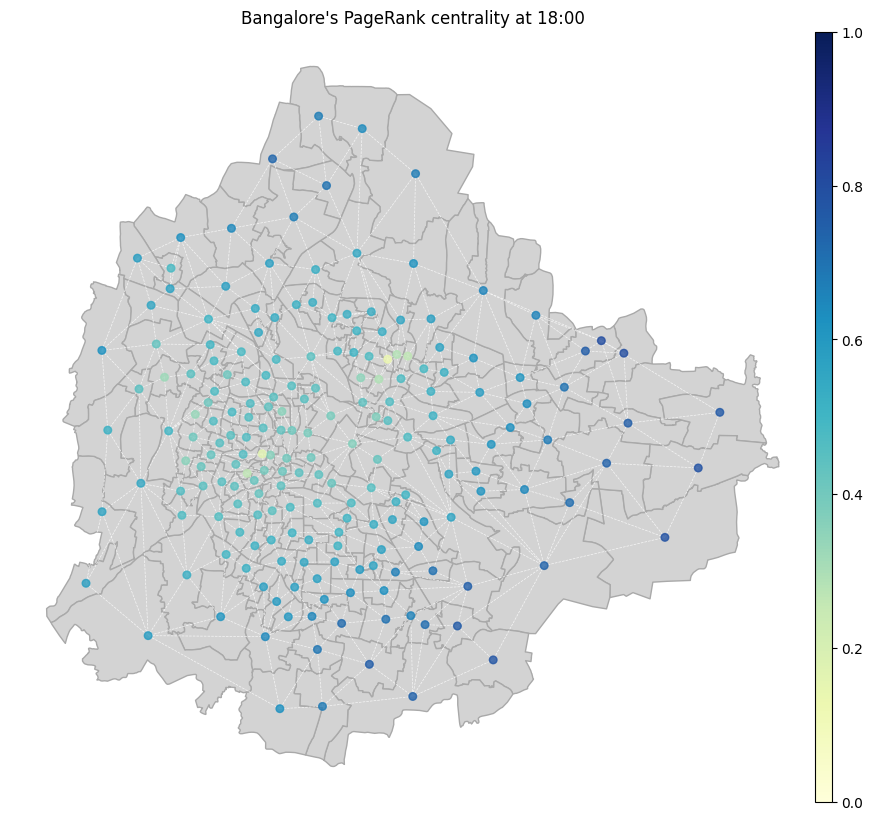

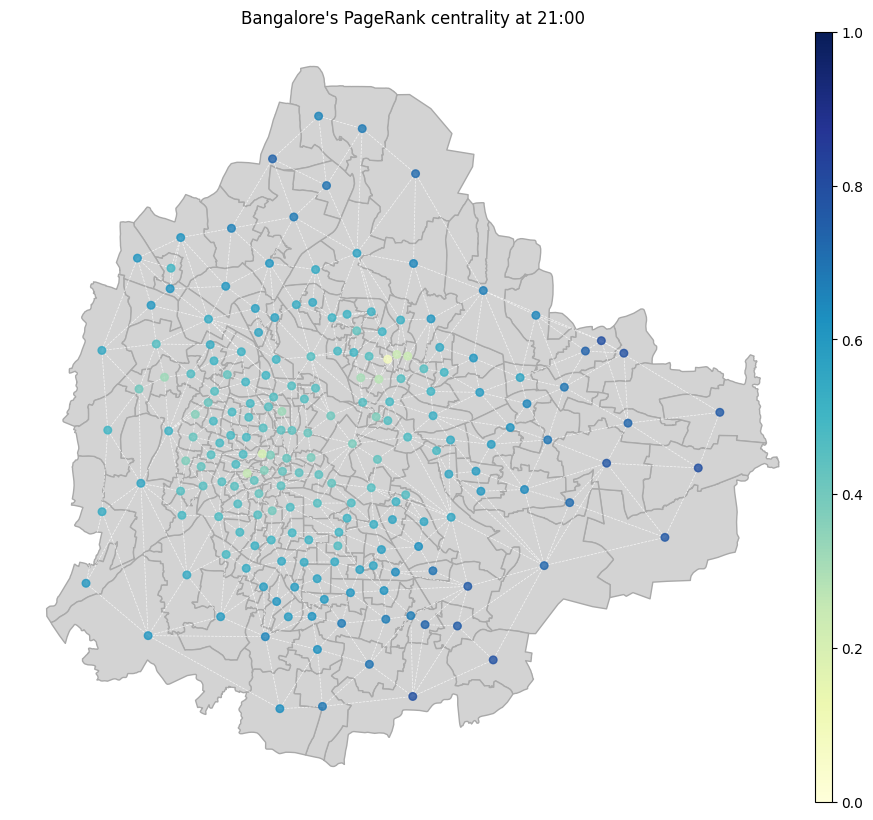

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_pagerank, CITY_NAME, 'PageRank')

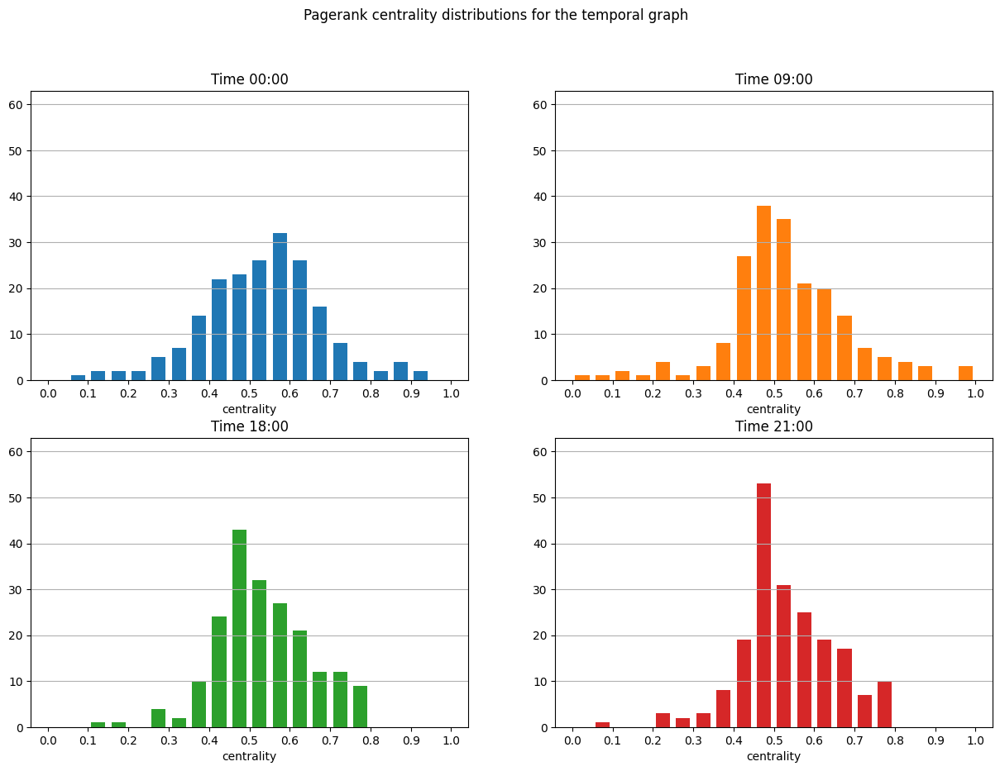

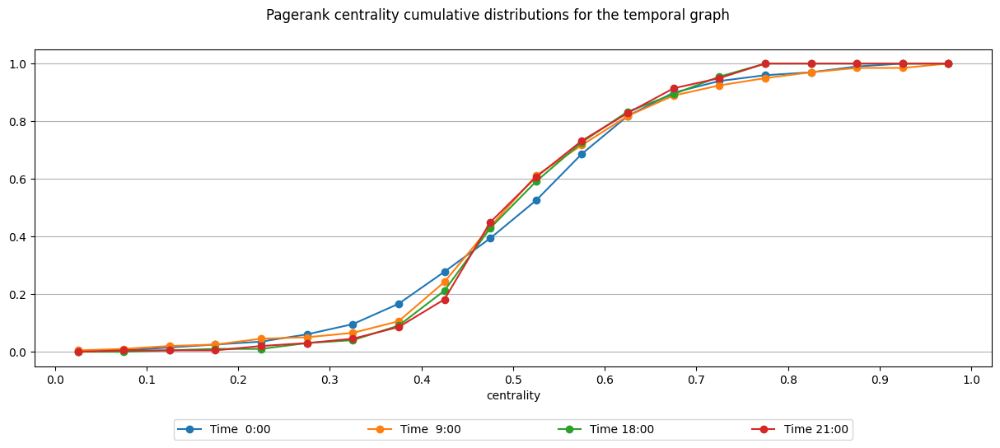

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_pagerank, 'PageRank centrality')

In [ ]:
from utils.metrics import get_nodes_pagerank_centrality

spatial_network_pagerank = get_nodes_pagerank_centrality(spatial_network, weight='weight', normalize=True)

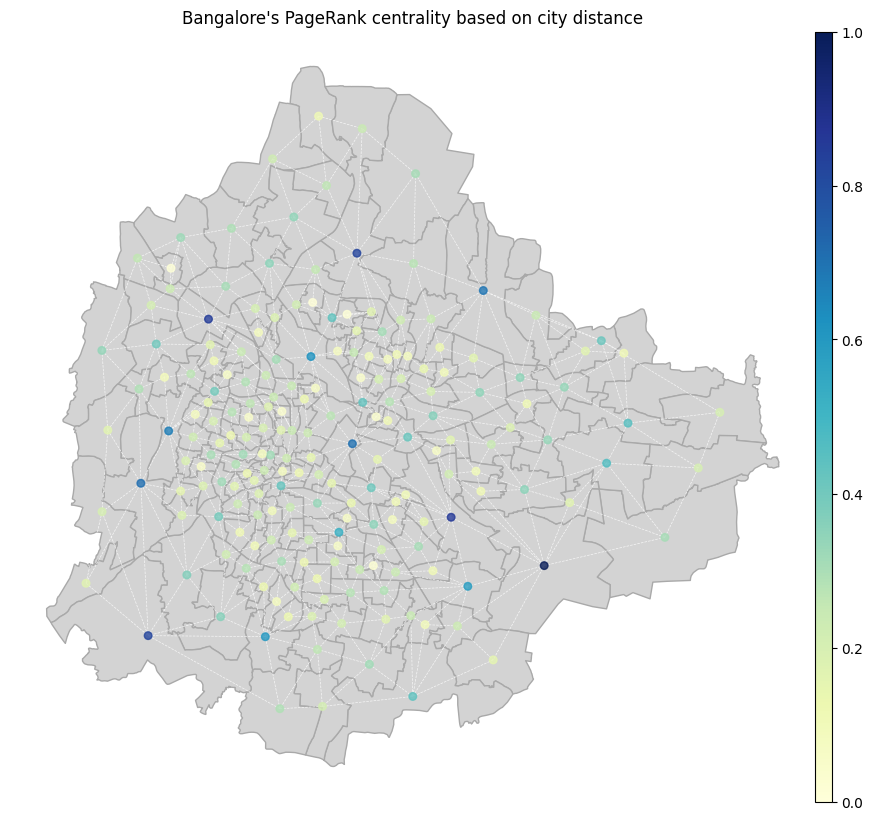

In [ ]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_pagerank,
                title=f"{CITY_NAME}'s PageRank centrality based on city distance")


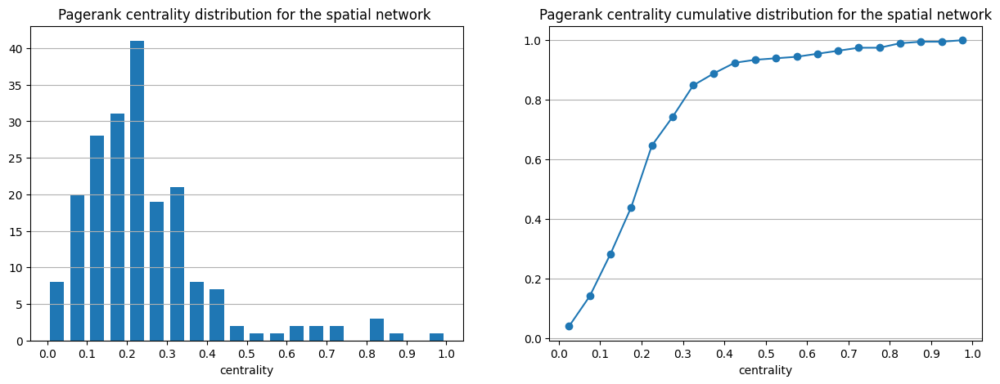

In [ ]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_pagerank, 'PageRank centrality')

In [ ]:
from utils.metrics import get_nodes_hits_centrality

temporal_networks_hubs = dict()
temporal_networks_authorities = dict()

for k, v in temporal_networks_dict.items():
    hubs, authorities = get_nodes_hits_centrality(v, normalize=True, weight='mean_travel_time')
    temporal_networks_hubs[k] = hubs
    temporal_networks_authorities[k] = authorities

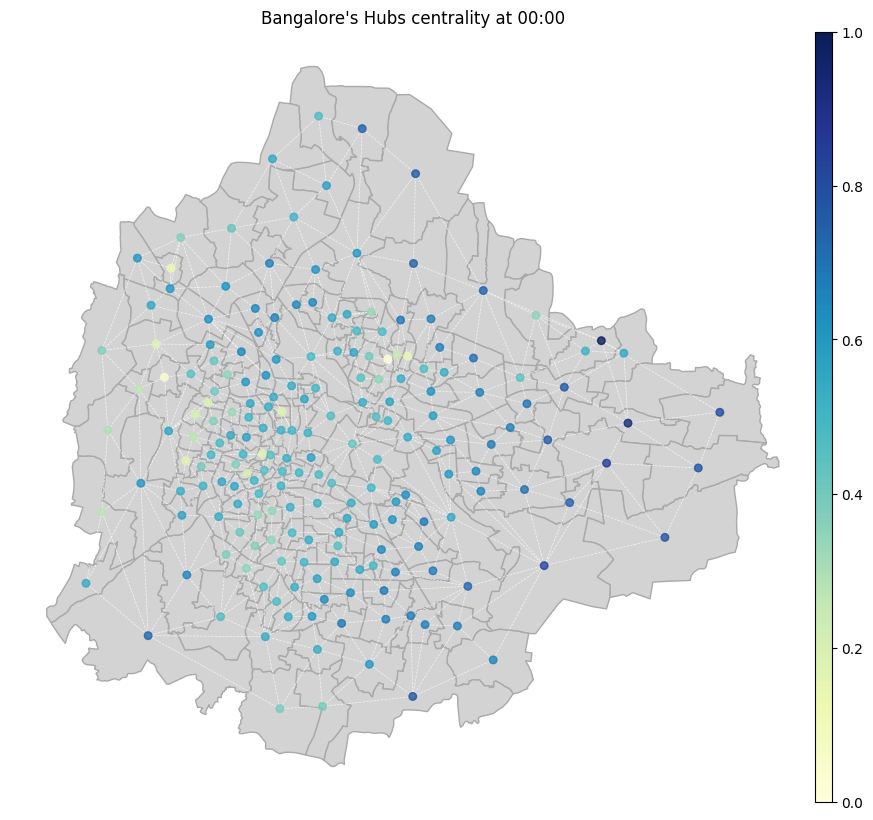

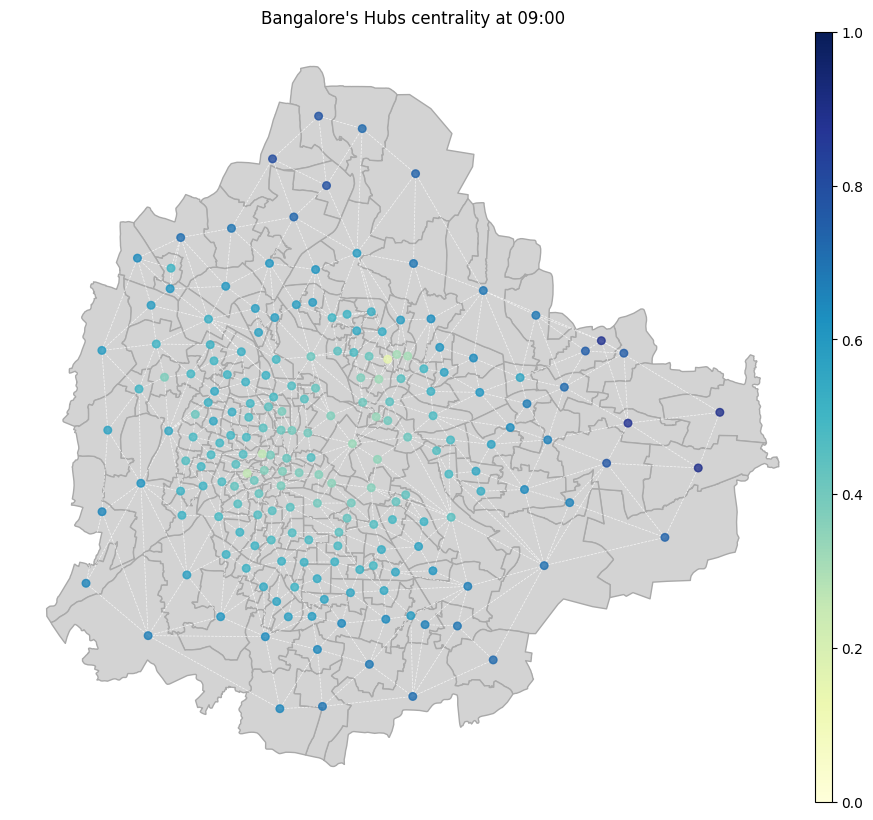

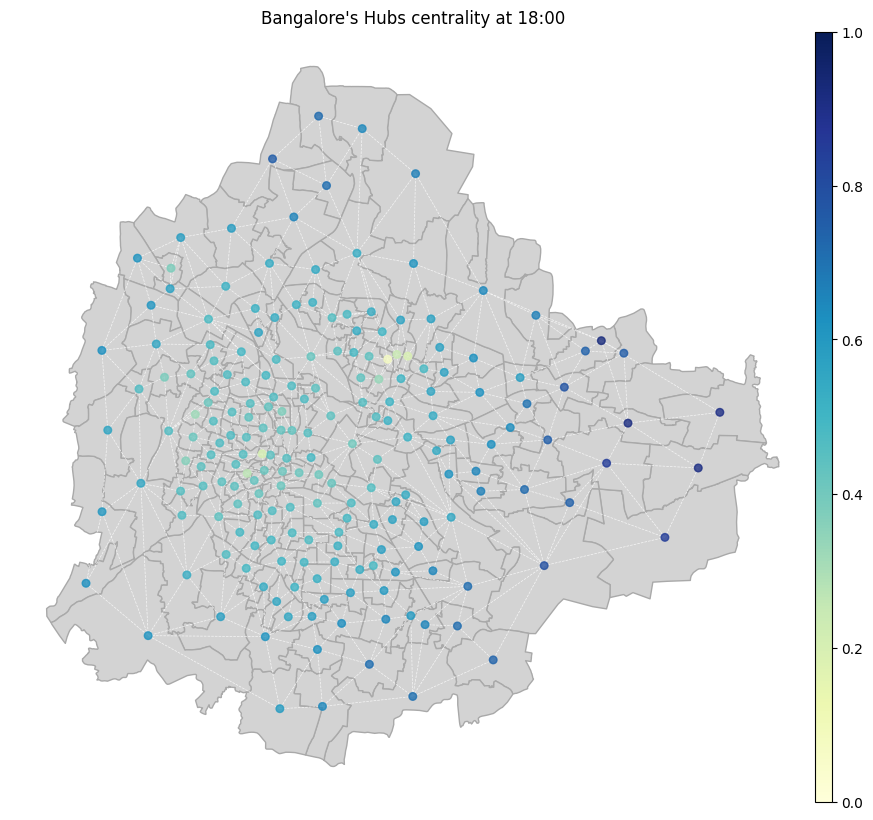

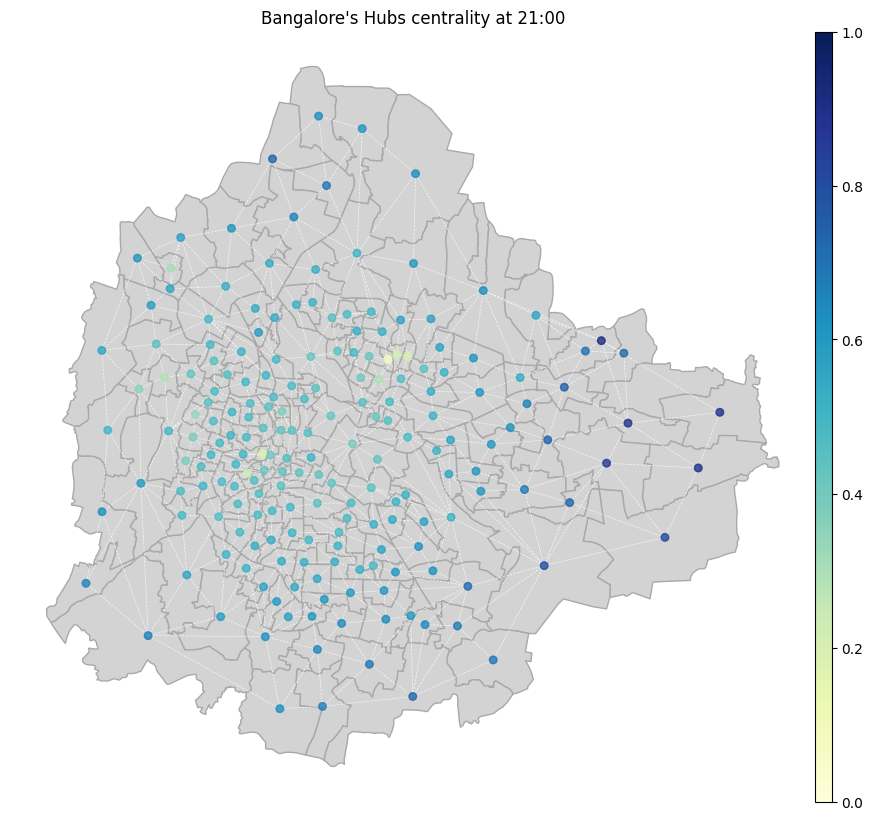

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_hubs, CITY_NAME, 'Hubs')

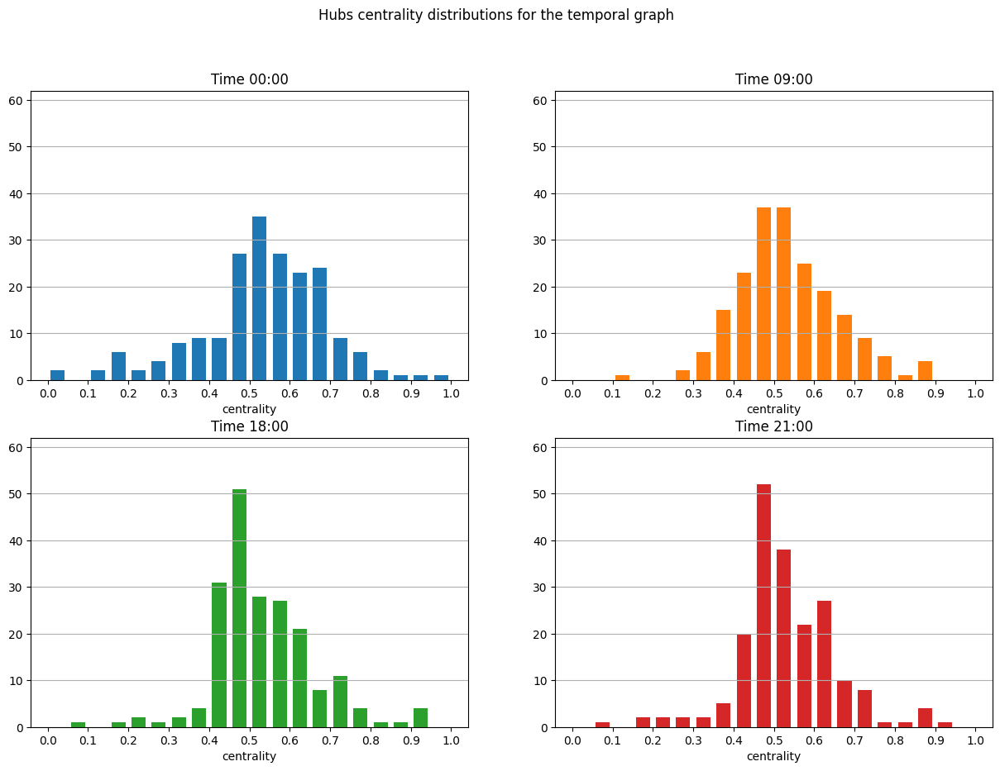

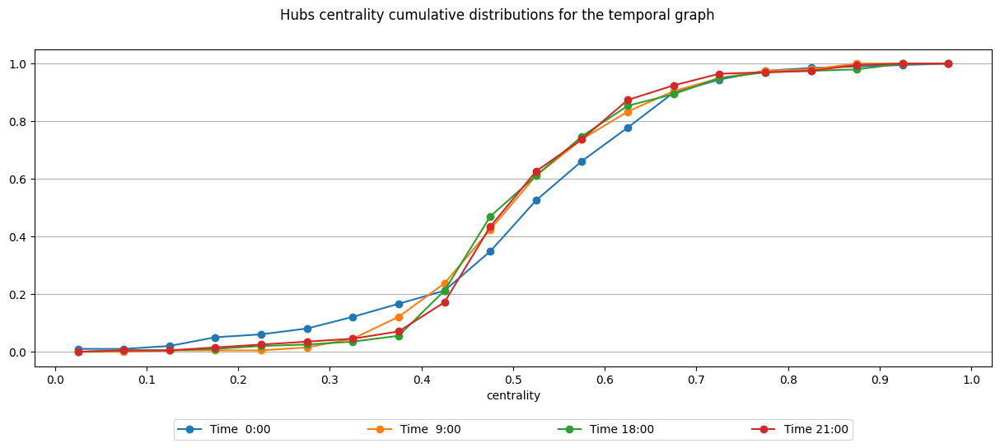

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_hubs, 'hubs centrality')

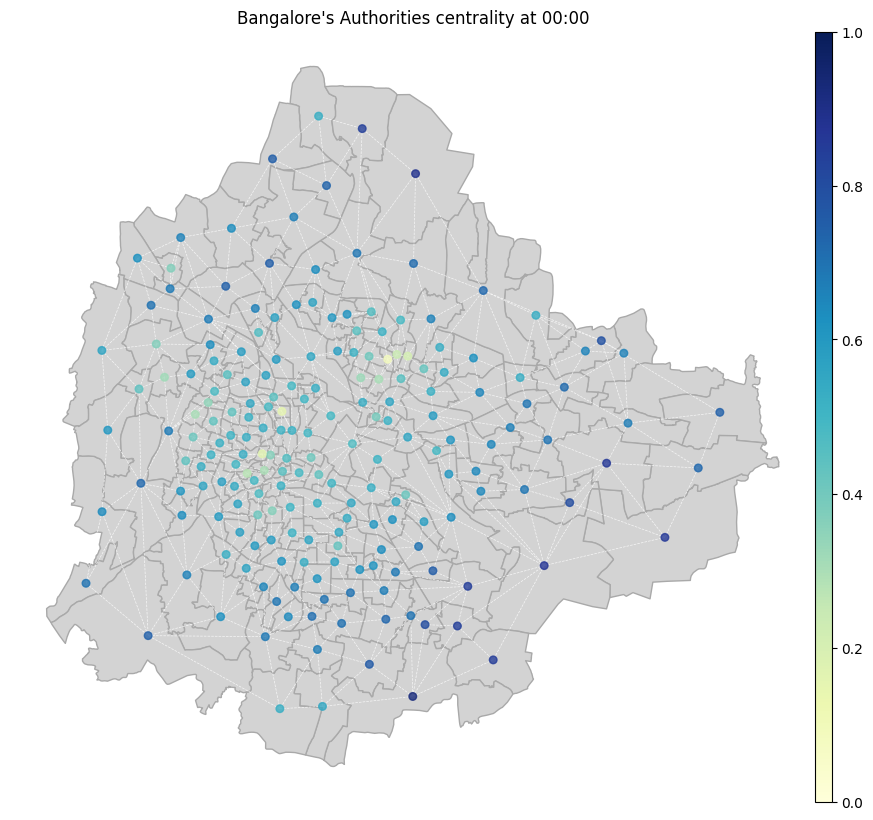

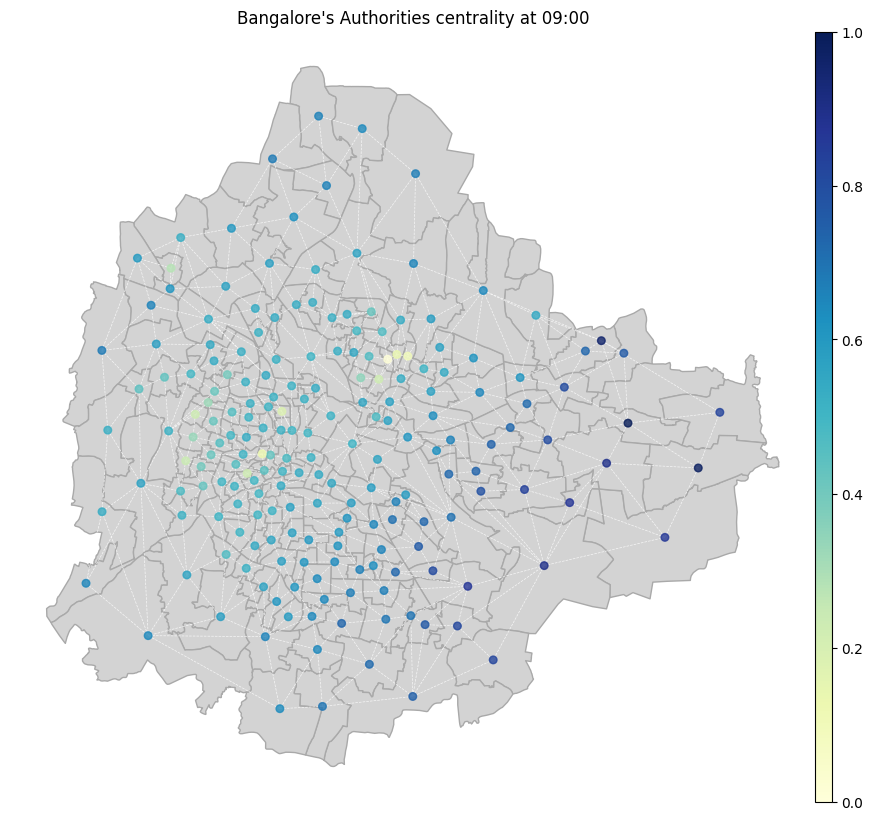

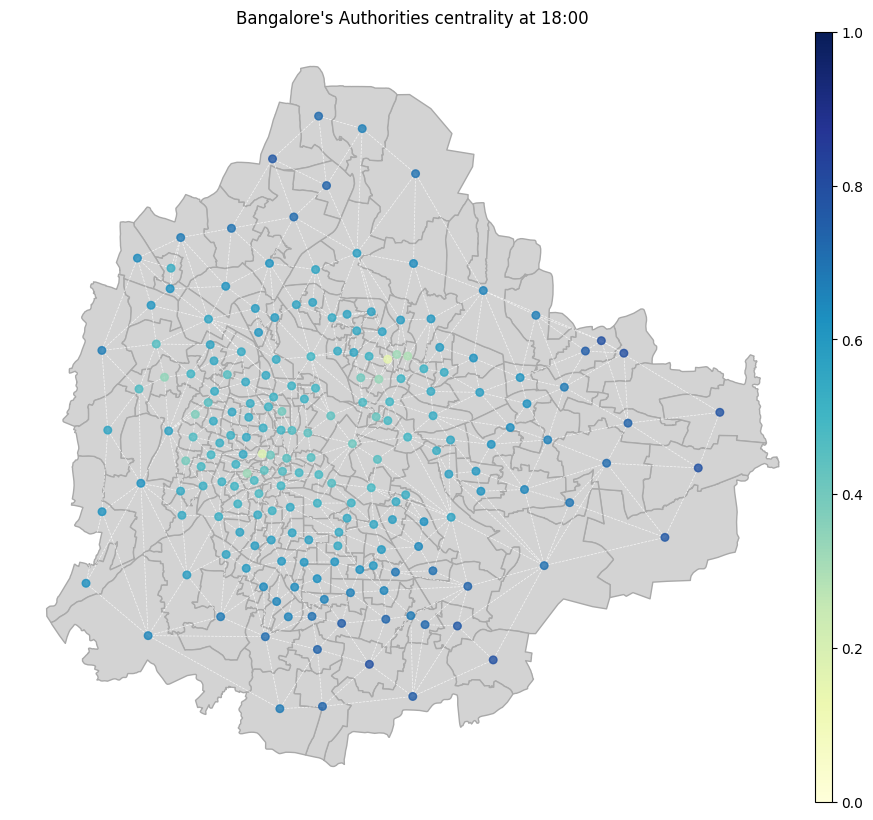

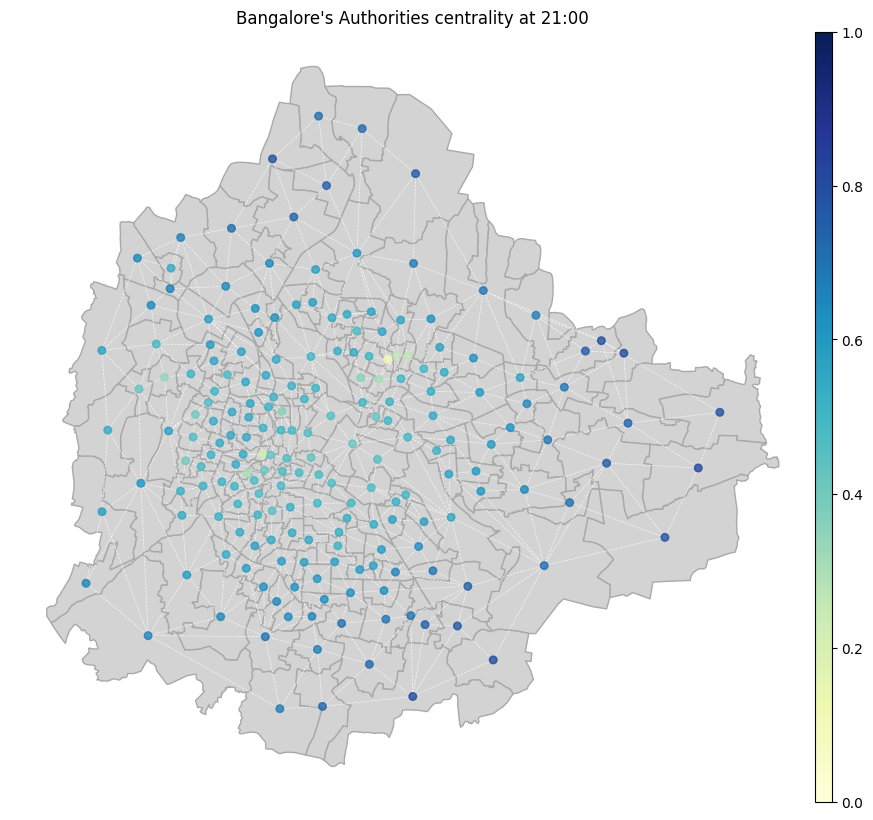

In [ ]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_authorities, CITY_NAME, 'Authorities')

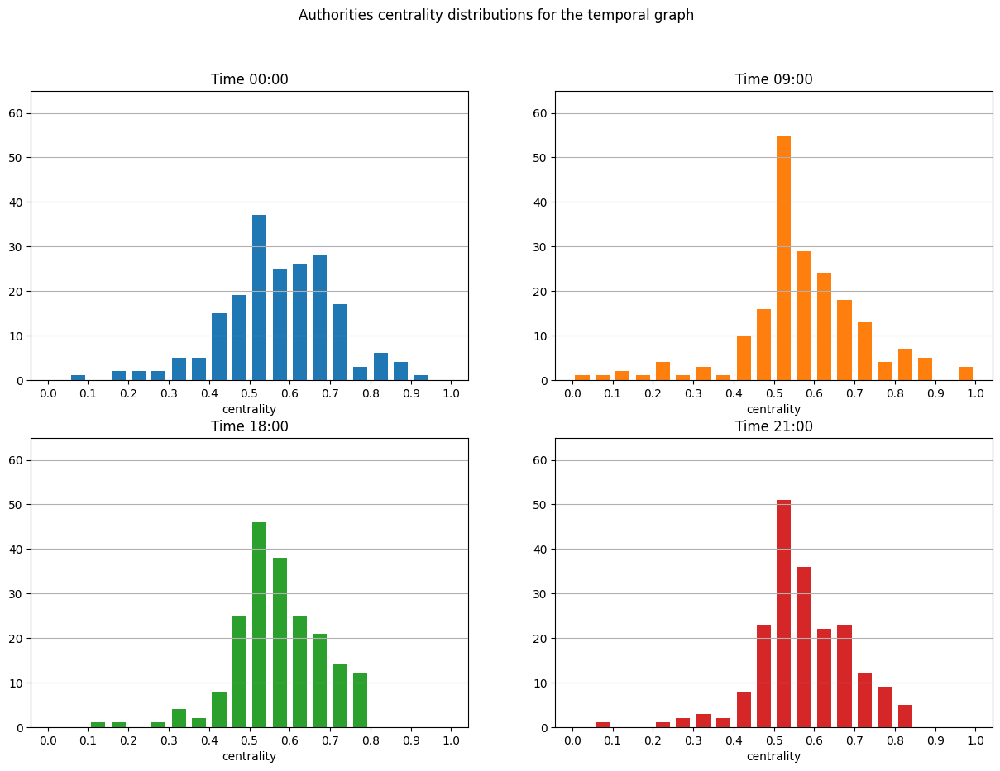

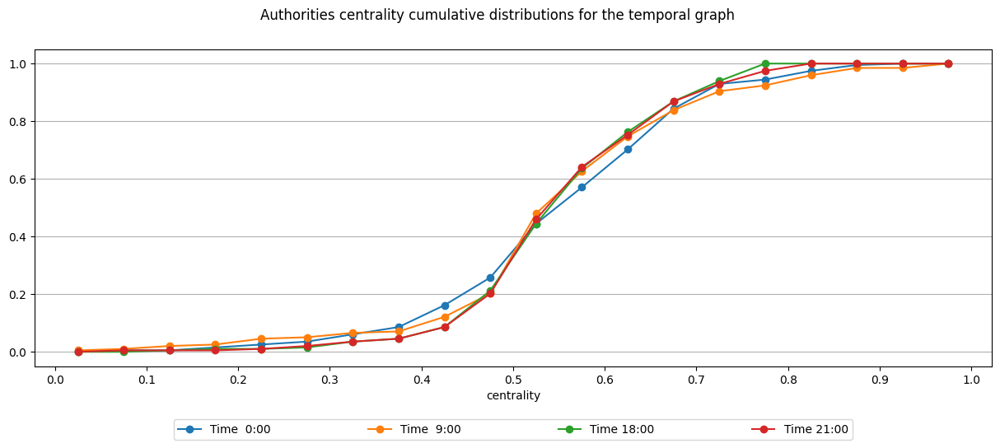

In [ ]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_authorities, 'authorities centrality')

In [ ]:
from utils.metrics import get_nodes_hits_centrality

spatial_network_hits = get_nodes_hits_centrality(spatial_network, weight='weight', normalize=False)

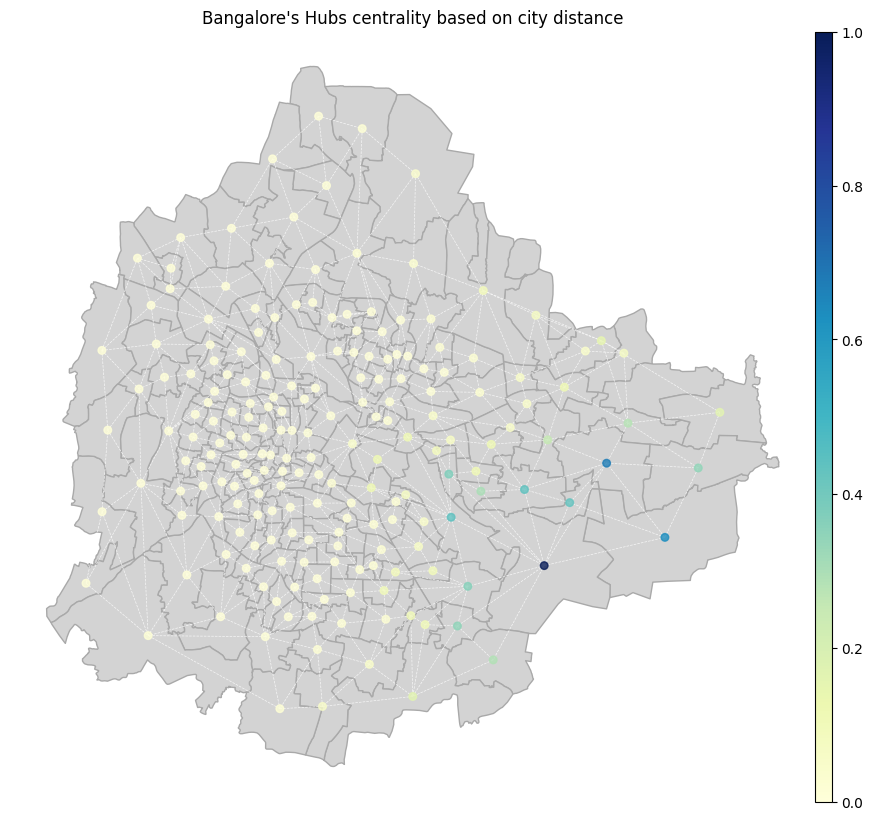

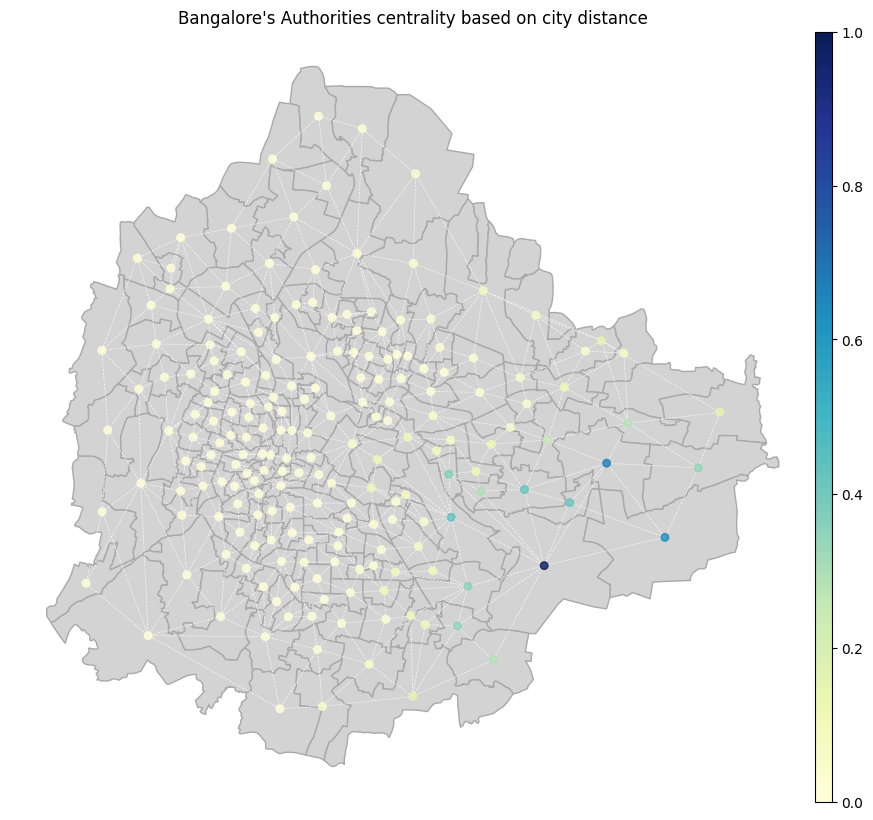

In [ ]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_hits[0],
                title = f"{CITY_NAME}'s Hubs centrality based on city distance")

plot_centrality(gdf, spatial_network, spatial_network_hits[1],
                title = f"{CITY_NAME}'s Authorities centrality based on city distance")


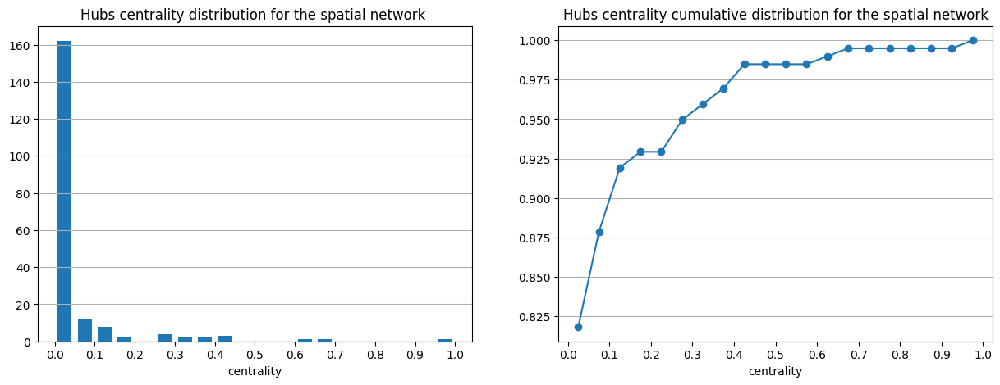

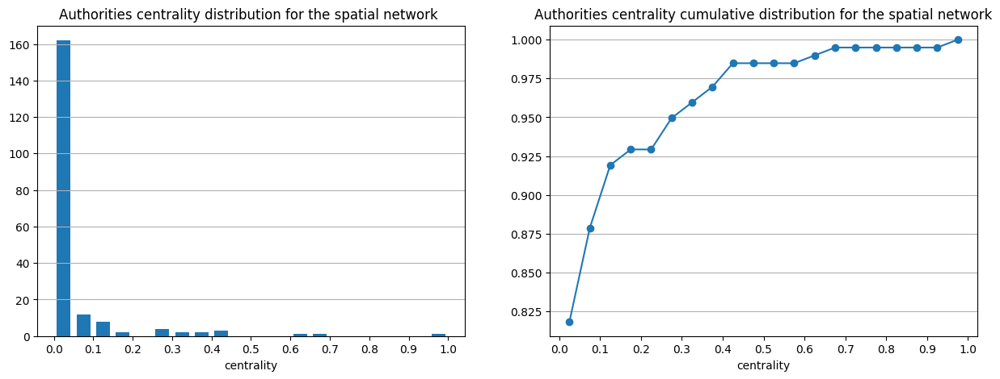

In [ ]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_hits[0], 'hubs centrality')
plot_spatial_network_centrality_distribution(spatial_network_hits[1], 'authorities centrality')

## Community Detection

In [ ]:
# Build a directory to save the results
RESULTS_DIR = 'results'
os.makedirs(RESULTS_DIR, exist_ok=True)

The community detection is applied on an undirected version of the temporal network for complexity and algorithmic compatibility resons. The undirected version of the temporal network is built below and its characteristics are illustrated

In [ ]:
undirected_temporal_networks_dict = {k: v.to_undirected() for k, v in temporal_networks_dict.items()}

In [ ]:
for k, v in undirected_temporal_networks_dict.items():
   print(f'Undirected temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())}')

Undirected temporal network at time 0: nodes: 198 edges: 17371
Undirected temporal network at time 9: nodes: 198 edges: 18761
Undirected temporal network at time 18: nodes: 198 edges: 18848
Undirected temporal network at time 21: nodes: 198 edges: 18637


In [ ]:
for k, v in undirected_temporal_networks_dict.items():
    print(f'Undirected temporal network at time {k} density: {nx.density(v)}')

Undirected temporal network at time 0 density: 0.890683484592114
Undirected temporal network at time 9 density: 0.961954571091627
Undirected temporal network at time 18 density: 0.9664154232682152
Undirected temporal network at time 21 density: 0.955596574885915


### 02.2.2 Community Detection based onWeighted K-Cores
A *weighted k-core* is a connected set of nodes where each has a weighted degree of value at least *k*. Once a *k-core*
community is computed, the algorithm is repeated for the remaining subgraph until all nodes are assigned to a community. This algorithm should define in the temporal graph similarly connected traffic-busy clusters, while it should create a partition of the spatial network based on groups of connected zones with similar distance between each other.

In [ ]:
from utils.metrics import get_k_cores_communities
from time import time

temporal_networks_k_core_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_k_core_communities[k] = get_k_cores_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.27 s
Time for computing the temporal network communities at time 09:00: 0.31 s
Time for computing the temporal network communities at time 18:00: 0.29 s
Time for computing the temporal network communities at time 21:00: 0.29 s

Total for computing the temporal network communities at time 21:00: 1.16 s


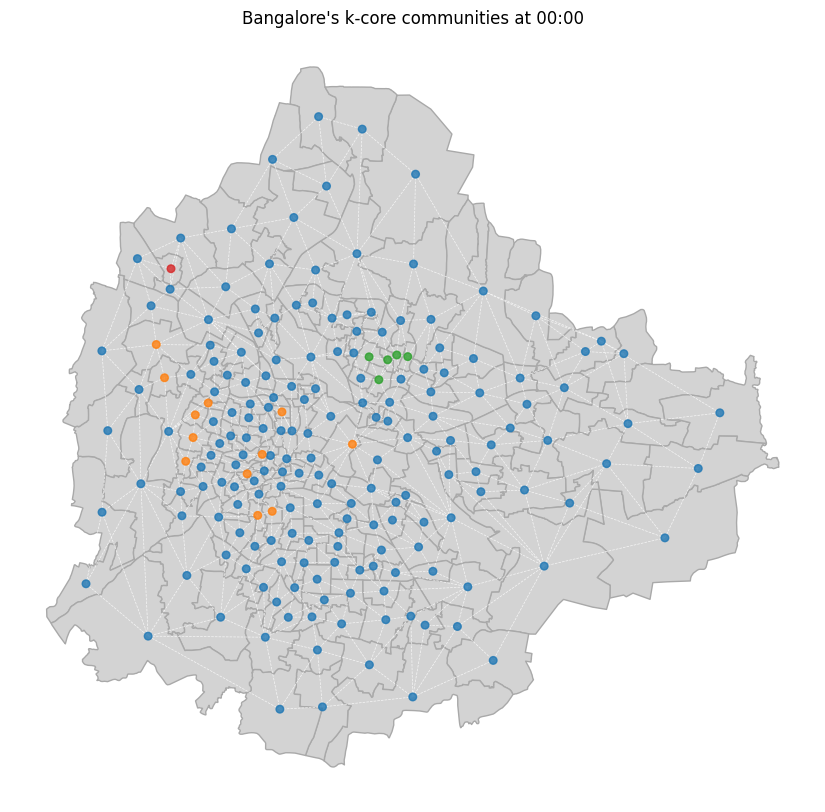

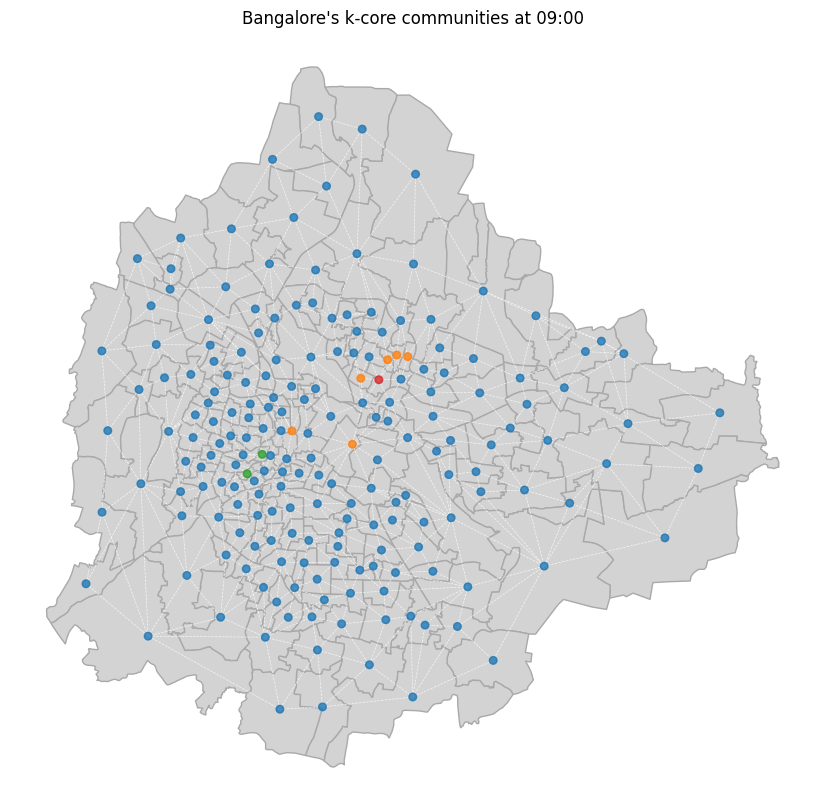

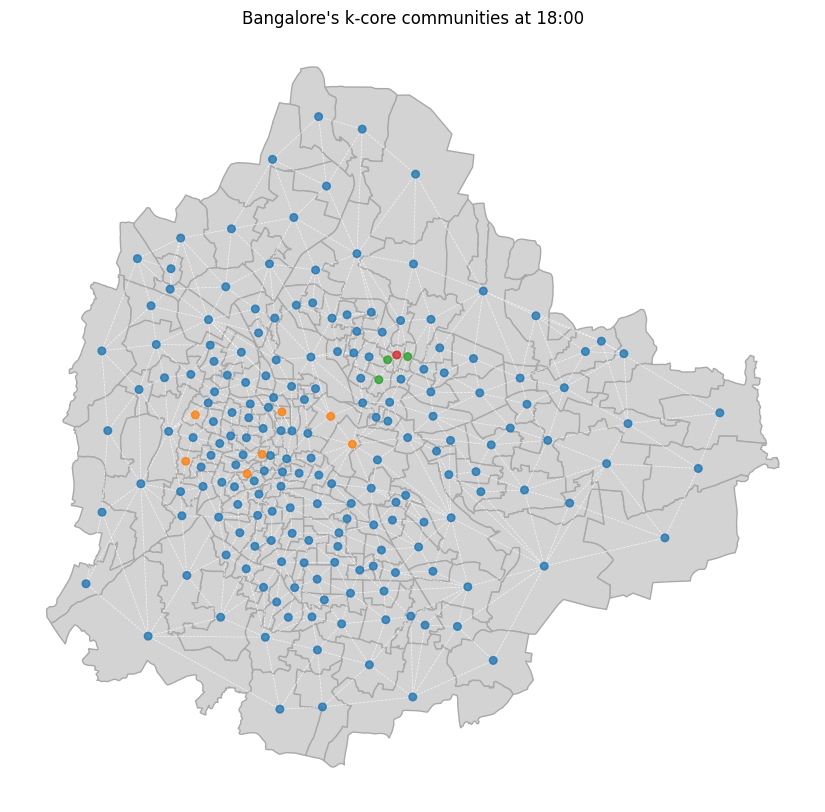

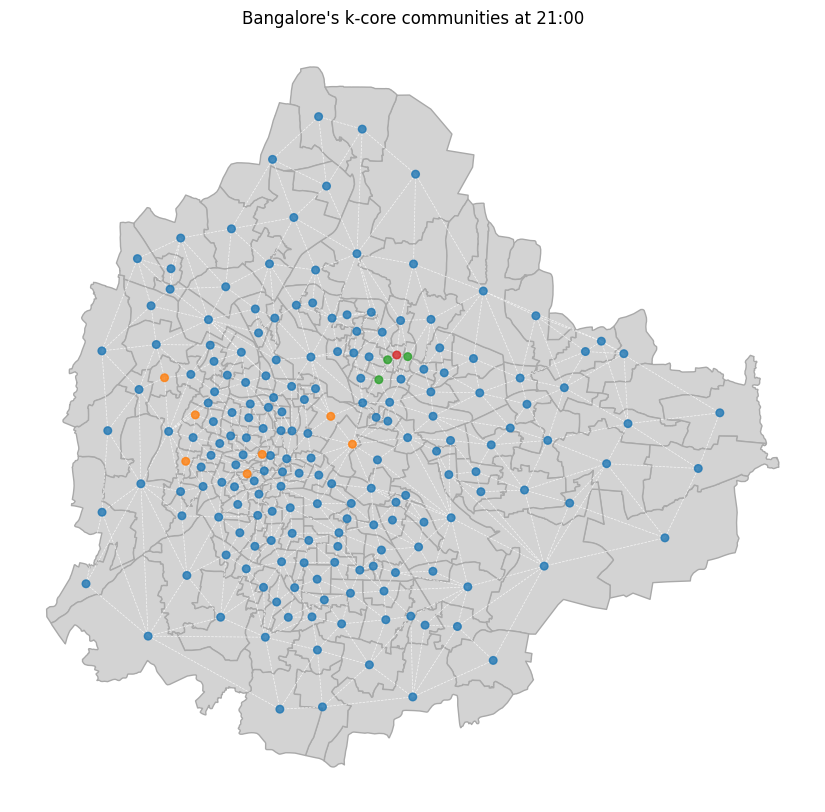

In [ ]:
from utils.graphics import plot_communities

for k, v in temporal_networks_k_core_communities.items():
    plot_communities(gdf, spatial_network, v, title = f"{CITY_NAME}'s k-core communities at {k:02d}:00")

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_k_core_communities, f)

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-temporal.pickle'), 'rb') as f:
    temporal_networks_k_core_communities = pickle.load(f)

In [ ]:
from utils.metrics import get_k_cores_communities

start_time = time()
spatial_network_k_core_communities = get_k_cores_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.10 s


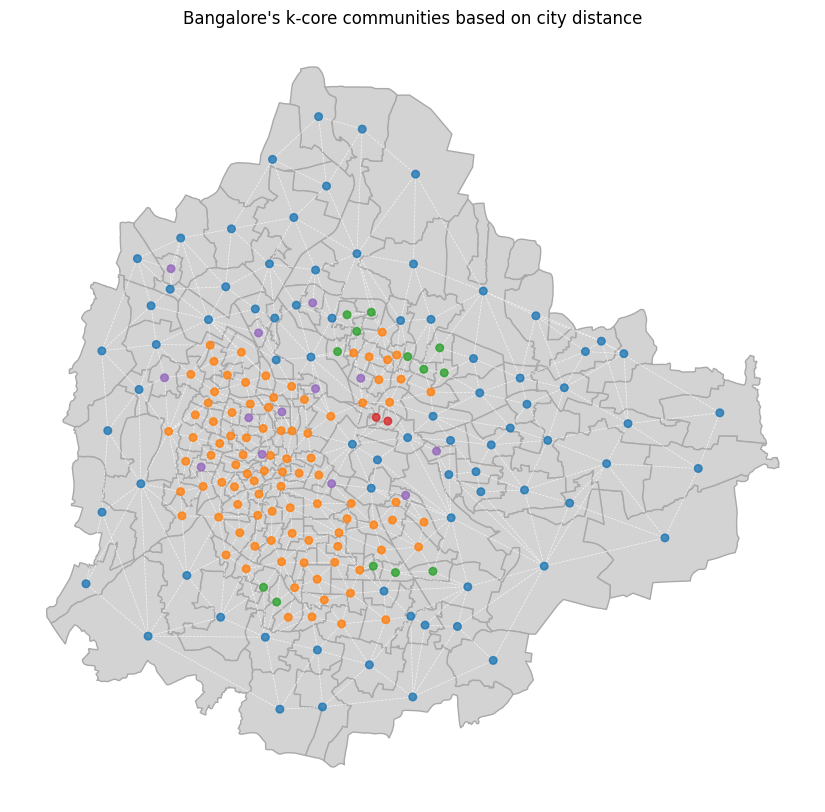

In [ ]:
from utils.graphics import plot_communities

plot_communities(gdf, spatial_network, spatial_network_k_core_communities,
                 title = f"{CITY_NAME}'s k-core communities based on city distance")

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_k_core_communities, f)

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-spatial.pickle'), 'rb') as f:
    spatial_network_k_core_communities = pickle.load(f)

### Louvain Community Detection Algorithm

In [ ]:
from utils.metrics import get_louvain_communities
from time import time

temporal_networks_louvain_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_louvain_communities[k] = get_louvain_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.32 s
Time for computing the temporal network communities at time 09:00: 0.35 s
Time for computing the temporal network communities at time 18:00: 0.52 s
Time for computing the temporal network communities at time 21:00: 0.64 s

Total for computing the temporal network communities at time 21:00: 1.82 s


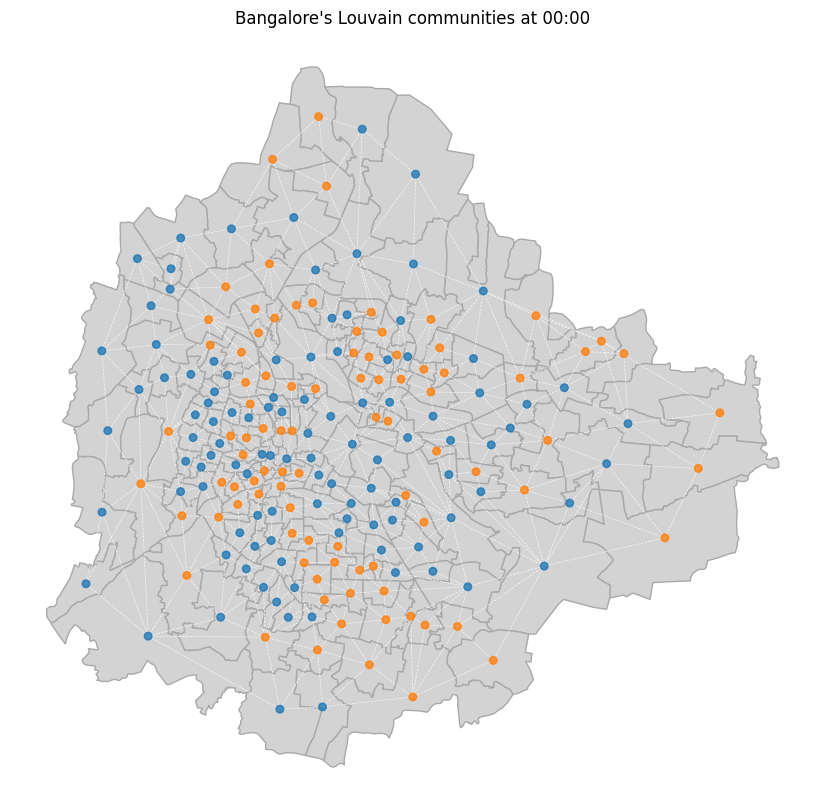

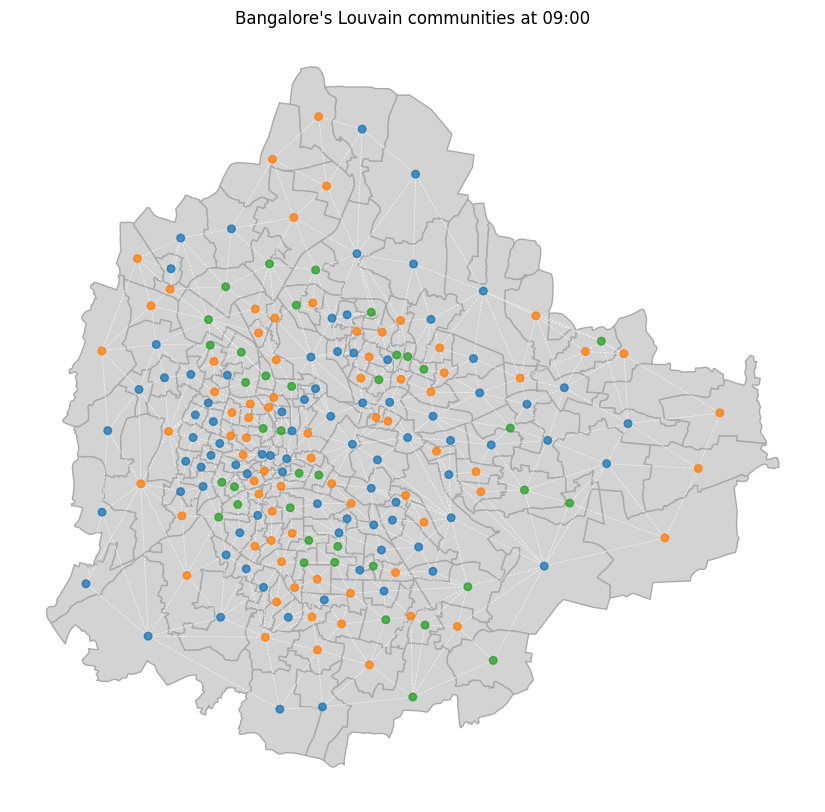

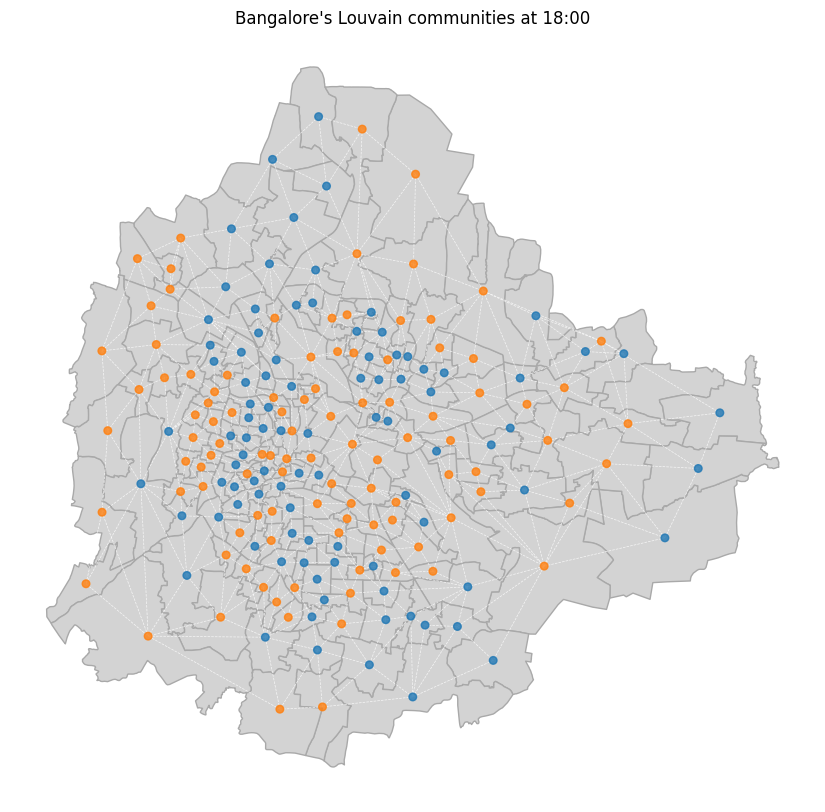

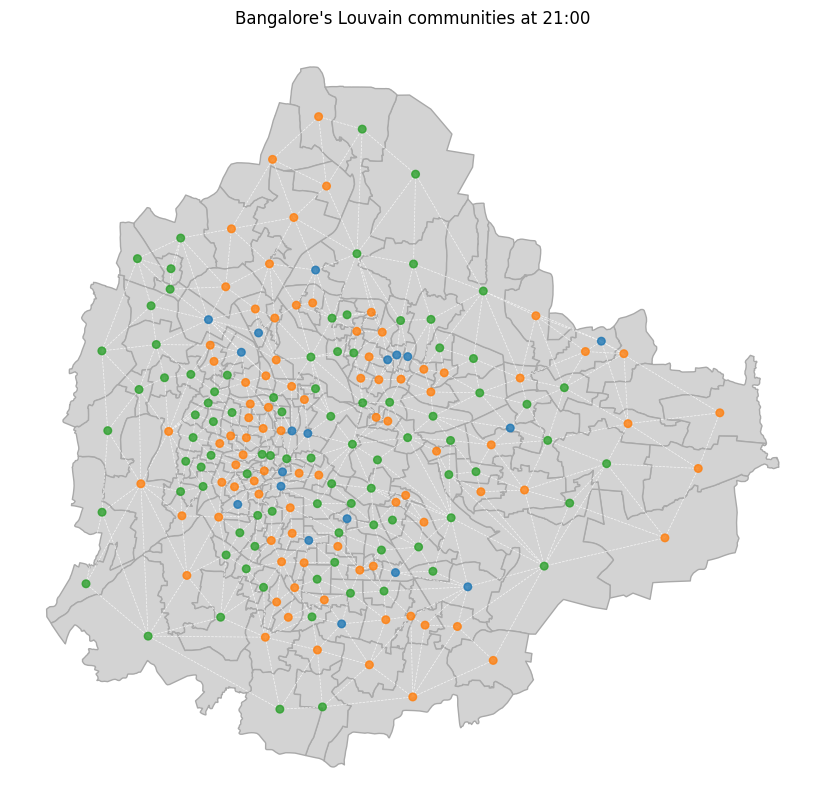

In [ ]:
from utils.graphics import plot_communities

for k, v in temporal_networks_louvain_communities.items():
    plot_communities(gdf, spatial_network, v,
                     title=f"{CITY_NAME}'s Louvain communities at {k:02d}:00")

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_louvain_communities, f)

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-temporal.pickle'), 'rb') as f:
    temporal_networks_louvain_communities = pickle.load(f)

In [ ]:
from utils.metrics import get_louvain_communities

start_time = time()
spatial_network_louvain_communities = get_louvain_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.03 s


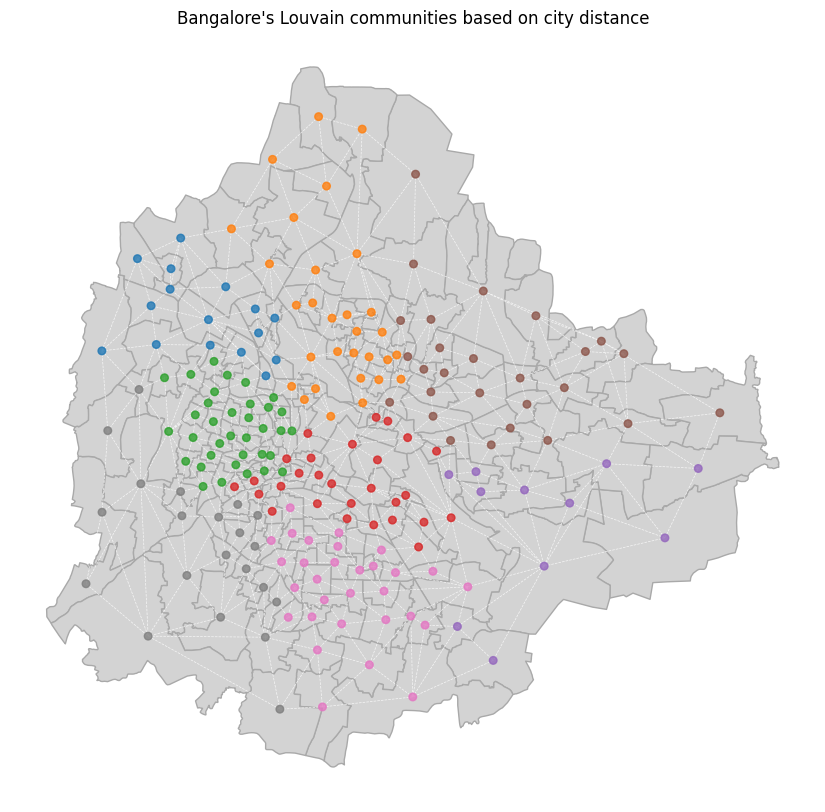

In [ ]:
from utils.graphics import plot_communities

plot_communities(gdf, spatial_network, spatial_network_louvain_communities,
                 title = f"{CITY_NAME}'s Louvain communities based on city distance")

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_louvain_communities, f)

In [ ]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-spatial.pickle'), 'rb') as f:
    spatial_network_louvain_communities = pickle.load(f)